# 1. Introduction

## 1.1 Problem Statement

Customer churn prediction is a critical aspect of business management, particularly for industries like telecommunications, internet service providers, pay TV companies, insurance firms, and alarm monitoring services. It involves understanding and addressing customer attrition, which refers to the loss of clients or customers.

For businesses in these sectors, measuring customer attrition is a vital business metric. This is because retaining an existing customer is significantly more cost-effective than acquiring a new one. As a result, these companies often have customer service branches dedicated to re-engaging customers who are considering leaving. The long-term value of recovered customers far outweighs that of newly acquired ones.

To address customer churn, predictive analytics comes into play through churn prediction models to assess the likelihood of customers leaving. These models prioritize a small list of potential defectors, enabling businesses to concentrate their customer retention efforts on those who are most at risk of churning.

---

## 1.2 Key Questions:
1. **What is the significance of Churn Rate for stakeholders (Customers, etc.)?** (1pt)  
2. **What are the characteristics of each Type of Customer (Churn or Not Churn)?** (2.5pt)  
3. **Which ML modeling can be implemented and represent model results?** (4.5pt)  
    - Including feature inputs and explaining feature importance.  
4. **What actions regarding qualitative and quantitative analytics could be implemented to enhance retention rate?** (2pt)

This analysis aims to leverage comprehensive customer data to improve customer engagement and satisfaction for a business' offerings.

---

## 1.3 Requirements:
- **Clear, simple, optimized code** (if possible) + code explanation.  
  - (OOP is a plus but optional)
- **Slide is clear, insightful, and delightful** (optional)
- **English is a must**  
  - (If slide and code are not presented in English, your result will be eliminated)
- **Step by Step training modeling** must be shown in the Appendix

---

## 1.4 Keywords:
- Binary Classification
- Python
- EDA
- Statistical Significance


# 2. Data Collection and Understanding

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

# import os
# os.chdir('/content/drive/MyDrive/MCI/MCI')

In [3]:
# import necessary libraries
import pandas as pd
import numpy as np
from tabulate import tabulate

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')


In [4]:
# Load training dataset and display first 5 rows
df = pd.read_csv('dataset1_80.csv')

#display dataset shape
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns.")
print(tabulate(df.head(), headers='keys', tablefmt='psql'))

There are 2666 rows and 20 columns.
+----+---------+------------------+-------------+----------------------+-------------------+-------------------------+---------------------+-------------------+--------------------+---------------------+-------------------+--------------------+-----------------------+---------------------+----------------------+----------------------+--------------------+---------------------+--------------------------+---------+
|    | State   |   Account length |   Area code | International plan   | Voice mail plan   |   Number vmail messages |   Total day minutes |   Total day calls |   Total day charge |   Total eve minutes |   Total eve calls |   Total eve charge |   Total night minutes |   Total night calls |   Total night charge |   Total intl minutes |   Total intl calls |   Total intl charge |   Customer service calls | Churn   |
|----+---------+------------------+-------------+----------------------+-------------------+-------------------------+------------

In [5]:
def check_data(data):
    """check prerequisite dataset characteristics, including data types, null values, duplicates, etc.
    """
    dict={}
    for col in data.columns:
        dtype = data[col].dtypes
        valid_instances = data[col].count()
        unique = data[col].nunique()
        null_count = data[col].isnull().sum()
        null_pct = round((null_count/valid_instances)*100,2)
        duplicates = data[col].duplicated().sum()
        dict[col] = dtype,valid_instances,unique,null_count, null_pct, duplicates
        data_check = pd.DataFrame(dict, index=["dtype","valid_instances","unique","total_null","null_pct","duplicates"]).T
    return data_check

check_data(df)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
State,object,2666,51,0,0.0,2615
Account length,int64,2666,205,0,0.0,2461
Area code,int64,2666,3,0,0.0,2663
International plan,object,2666,2,0,0.0,2664
Voice mail plan,object,2666,2,0,0.0,2664
Number vmail messages,int64,2666,42,0,0.0,2624
Total day minutes,float64,2666,1489,0,0.0,1177
Total day calls,int64,2666,115,0,0.0,2551
Total day charge,float64,2666,1489,0,0.0,1177
Total eve minutes,float64,2666,1442,0,0.0,1224


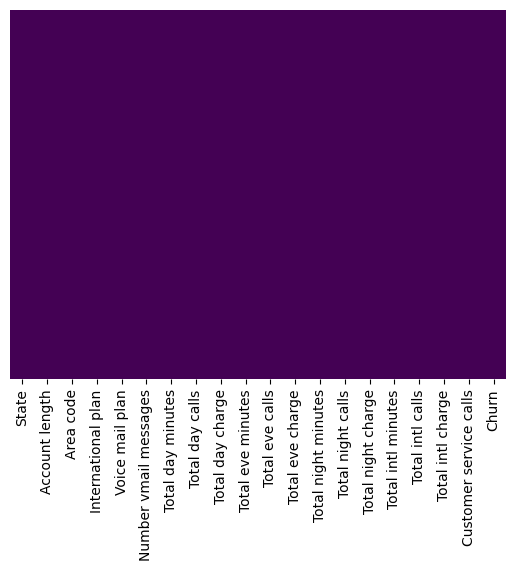

In [6]:
# check missing values
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
plt.show()

In [7]:
# check data duplicates

print(f"Total number of duplicates: {df.duplicated().sum()}")

Total number of duplicates: 0


## Comment

---
<p style="font-size:22px; font-weight:bold">🔹 Quick Bits: </p>

- Overall, the data types are relatively correctly defined, aligning well with each attributes
- The dataset appears to be meticulously preprocessed, with no missing values observed.
- The same remark is true with duplicated entries.
>This indicates preprocessing step prior to the analysis, ensuring the data's integrity for accurate and reliable results.

---


In [8]:
def check_unique(data):
    """check unique values in each column
    """
    nunique=data.apply(lambda col: col.nunique())
    unique_values = data.apply(lambda col: list(col.unique()))
    data_check = pd.DataFrame({'uni_count': nunique, 'unique_values': unique_values})
    return data_check

#display all unique values
pd.set_option('display.max_colwidth', None)
print(tabulate(check_unique(df), headers='keys', tablefmt='psql'))

pd.reset_option('display.max_colwidth')

+------------------------+-------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [9]:
# display summary statistics for numerical columns
df.select_dtypes(exclude='object').describe().T

,count,mean,std,min,25%,50%,75%,max
Account length,2666.0,100.620405,39.563974,1.00,73.0000,100.00,127.000,243.00
Area code,2666.0,437.438860,42.521018,408.00,408.0000,415.00,510.000,510.00
Number vmail messages,2666.0,8.021755,13.612277,0.00,0.0000,0.00,19.000,50.00
Total day minutes,2666.0,179.481620,54.210350,0.00,143.4000,179.95,215.900,350.80
Total day calls,2666.0,100.310203,19.988162,0.00,87.0000,101.00,114.000,160.00
Total day charge,2666.0,30.512404,9.215733,0.00,24.3800,30.59,36.700,59.64
Total eve minutes,2666.0,200.386159,50.951515,0.00,165.3000,200.90,235.100,363.70
Total eve calls,2666.0,100.023631,20.161445,0.00,87.0000,100.00,114.000,170.00
Total eve charge,2666.0,17.033072,4.330864,0.00,14.0500,17.08,19.980,30.91
Total night minutes,2666.0,201.168942,50.780323,43.70,166.9250,201.15,236.475,395.00


# 3. Data Preprocessing

## 3.1 Define Column Reordering Function

In [10]:
def col_order(data,col,des):
    """define function to reorder columns when necessary
    """
    col_index=data.columns.get_loc(des)
    data.insert(col_index,col,data.pop(col))

## 3.2 Standardize Column Names

In [11]:
# standardize column names
import re

df.columns = [re.sub(r'(?<=[a-z])([A-Z])', r'_\1', i).replace(' ', '_').lower() for i in df.columns]

print(f"New column names:\n {df.columns}")

New column names:
 Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge', 'customer_service_calls',
       'churn'],
      dtype='object')


## 3.3 Modifying Data Types

In [12]:
# replacing 'no' with 0 and 'yes' with 1 for international plan and voice mail plan

bool_dict = {'No': 0, 'Yes': 1}

for col in ['international_plan', 'voice_mail_plan']:
    df[col] = df[col].map(bool_dict).astype(int)

    print(f"Unique values for {col}:\n {df[col].unique()}")

Unique values for international_plan:
 [0 1]
Unique values for voice_mail_plan:
 [1 0]


In [13]:
# changing area code to categorical variable

df['area_code'] = df['area_code'].astype('category')

In [14]:
check_data(df)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
state,object,2666,51,0,0.0,2615
account_length,int64,2666,205,0,0.0,2461
area_code,category,2666,3,0,0.0,2663
international_plan,int32,2666,2,0,0.0,2664
voice_mail_plan,int32,2666,2,0,0.0,2664
number_vmail_messages,int64,2666,42,0,0.0,2624
total_day_minutes,float64,2666,1489,0,0.0,1177
total_day_calls,int64,2666,115,0,0.0,2551
total_day_charge,float64,2666,1489,0,0.0,1177
total_eve_minutes,float64,2666,1442,0,0.0,1224


### Quick Comment
---
<p style="font-size:22px; font-weight:bold">🔹 Quick Bits: </p>

- All in all, since the data has already been preprocessed beforehand, there is little necessity to perform any practice further. That being said, binary data values of `international plan` and `voice mail plan` columns are remapped with 0 and 1 for No and Yes, respectively, faciliatting the later model construction and fitting process.
- Also, as `area codes` are discrete values, they can be converted to categorical data types.
- Instead, I will focus on the EDA procedure. Any further adjustment to the dataset will be performed along the way or later in the Feature Engineering Stage if needed

---


## 3.4 Checking Outliers

In [15]:
fig = px.box(data_frame=df.select_dtypes(include=np.number),orientation="v")
fig.update_layout(
    width=1000,
    height=500
)

---
<p style="font-size:22px; font-weight:bold">🔹 Quick Bits: </p>

- It is discernible that many of the numerical features within the dataset contains outliers.
- However, the majority of outliers' values apparently fall relatively close to the fence (or colloquially common range), there is absolutely no extreme outlier in the dataset  

> This requires further scrutiny into the total number of outliers for each feature, comparing their values/common characteristics, etc

---


In [16]:
def check_outliers(data):
    """check outliers and return outliers values for each attribute"""
    outliers = {}

    for col in data.select_dtypes(include=np.number).columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        col_outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
        outliers[col] = col_outliers


    print("Summary Statistics for TelCom customers' attributes:")
    print(tabulate(data.describe(), headers='keys', tablefmt='pretty'))
    print("\n\n")

    print("OUTLIERS BREAKDWOWN: \n")
    for col, outlier_data in outliers.items():
        if len(outlier_data) == 0:
            continue
        else:
            print("\n")
            print(f"Outliers in {col}:", len(outlier_data),f" - Accounting for {round(len(outlier_data)/len(data)*100,2)}% of data")
            print("Upper 5 outliers:\n",tabulate(outlier_data.sort_values(by=col, ascending=False).head(), headers='keys', tablefmt='pretty'))
            print("Lower 5 outliers:\n",tabulate(outlier_data.sort_values(by=col, ascending=False).tail(), headers='keys', tablefmt='pretty'))
            print("\n")
            print("#"*200)

check_outliers(df)



Summary Statistics for TelCom customers' attributes:
+-------+--------------------+---------------------+---------------------+-----------------------+--------------------+--------------------+--------------------+--------------------+--------------------+-------------------+---------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------------+
|       |   account_length   | international_plan  |   voice_mail_plan   | number_vmail_messages | total_day_minutes  |  total_day_calls   |  total_day_charge  | total_eve_minutes  |  total_eve_calls   | total_eve_charge  | total_night_minutes | total_night_calls  | total_night_charge | total_intl_minutes |  total_intl_calls  | total_intl_charge  | customer_service_calls |
+-------+--------------------+---------------------+---------------------+-----------------------+--------------------+--------------------+--------------------+--------------------+-------------

In [17]:
# plot distribution for international_plan and customer_service_calls
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, subplot_titles=('International Plan', 'Customer Service Calls'))
fig.add_trace(px.histogram(df, x='international_plan').data[0], row=1, col=1)
fig.add_trace(px.histogram(df, x='customer_service_calls').data[0], row=1, col=2)

fig.update_layout(height=500, width=1000, showlegend=False)
fig.show()


---
<h3 style="font-size:22px; font-weight:bold; color:pink">🔹 Quick Insights: </h3>

- After breakdowing outliers by features, we can see that even though outliers scatter throughout numerical attributes, the numbers are mostly negligible, with the majority of which accounting for under 2% or even 1% off all records. Therefore, we can neglect the existence of outliers in such columns and <b>preliminarily conclude that these features (excluding binominal type column) follow normal distribution </b>

- However, there are 2 columns with more "discernible" figures:
    + `international_plan`: with 270 entries (<i>~10.13%</i>)
    + `customer_service_calls`: with 210 entries (<i>~7.88%</i>)
<br>
<br>

- **Insights:**
    + The reason for `international_plan` is understandable since it takes in between only 2 values: Yes or No. This doesn't imply that the data is erroneous, but simply that fewer customers are not as interested in international calling as domestic phone calling, which makes the "No" entries stand out as a significant deviation.

    + For `customer_service_calls`, this column displays highly right-skewed distribution, indicating that there is a fraction of customers undergoing persistent issues (4+ calls), which may signal dissatisfaction for the current service. Since the bulk of customers rarely call customer service, this small group stands out as outliers, even though they represent valid customer behaviors. >> <a style="color:pink"> This can be an important attribute to identify the satisfaction hence churn prediction of customers (require further analysis later)</a>



---


# 4. Exploratory Data Analysis (EDA)

## 4.1 Univariate Analysis

In [18]:
len(df.columns)

20

In [19]:

cat_cols = df.select_dtypes(include=['object','category','bool']).columns
num_cols = df.select_dtypes(include=np.number).columns

def visualize_cat_and_num(data, cat_cols, num_cols):
    # make subplot layout of 4x5
    fig = make_subplots(rows=5, cols=4, subplot_titles=cat_cols.tolist() + num_cols.tolist())

    # Plot categorical columns
    for i, cat_col in enumerate(cat_cols):
        fig.add_trace(px.histogram(data, x=cat_col).data[0], row=(i // 4) + 1, col=(i % 4) + 1)

    # Plot numerical columns: either with histogram or boxplot >> I choose histogram for now
    for i, num_col in enumerate(num_cols):
        fig.add_trace(px.histogram(data, x=num_col).data[0], row=((i + len(cat_cols)) // 4) + 1, col=((i + len(cat_cols)) % 4) + 1)

    fig.update_layout(height=1500, width=1200, showlegend=False)
    fig.show()

visualize_cat_and_num(df, cat_cols, num_cols)


---
<h3 style="font-size:22px; font-weight:bold; color:pink">🔹 Key Insights: </h3>

- `Imbalanced Data for Churn and Non-Churn`: The Churn variable shows that there are significantly more non-churned customers than churned ones, which may require techniques like resampling later in the model construction phase

- `Feature Underutilization`: Features like `Number of Voicemail Messages`, `International Plan`, and `International Calls` are underutilized by a large portion of the customer base, with the majority of customers not using these services. This suggests that these features may have a different impact on customer behavior for a smaller subset of customers.
    + For example, there is a clear discrepancy between Voicemail Messages user and non-user, in which once using it, the frequency would range at a fairly high value (around 30-40 times). This could indicate a satisfaction among voicemail user, leading to a lower churn rate for this particular group? This could probably be a factor
    + ...
    > This will be explored further in multivariate analysis

- `Usage Consistency`: The total minutes and calls (day, evening, night) show fairly normal distributions, indicating that most customers have regular, consistent usage patterns, this can differentiate a sign of customer satisfaction **(i.e. These consistent, moderate users are less likely to churn because their needs are being met by the telecom provider, which results in regular service engagement)**. These usage features are likely to play a significant role in distinguishing between churners and non-churners.

- `Customer Service Calls`: The Customer Service Calls variable shows a few customers making repeated calls, which could be an important factor in predicting churn. Frequent customer service interaction is often linked to dissatisfaction.

---


## 4.2 Comparative Analysis Between Churned and Non-Churned Customers

### 4.2.1 Overview

<Figure size 2000x2000 with 0 Axes>

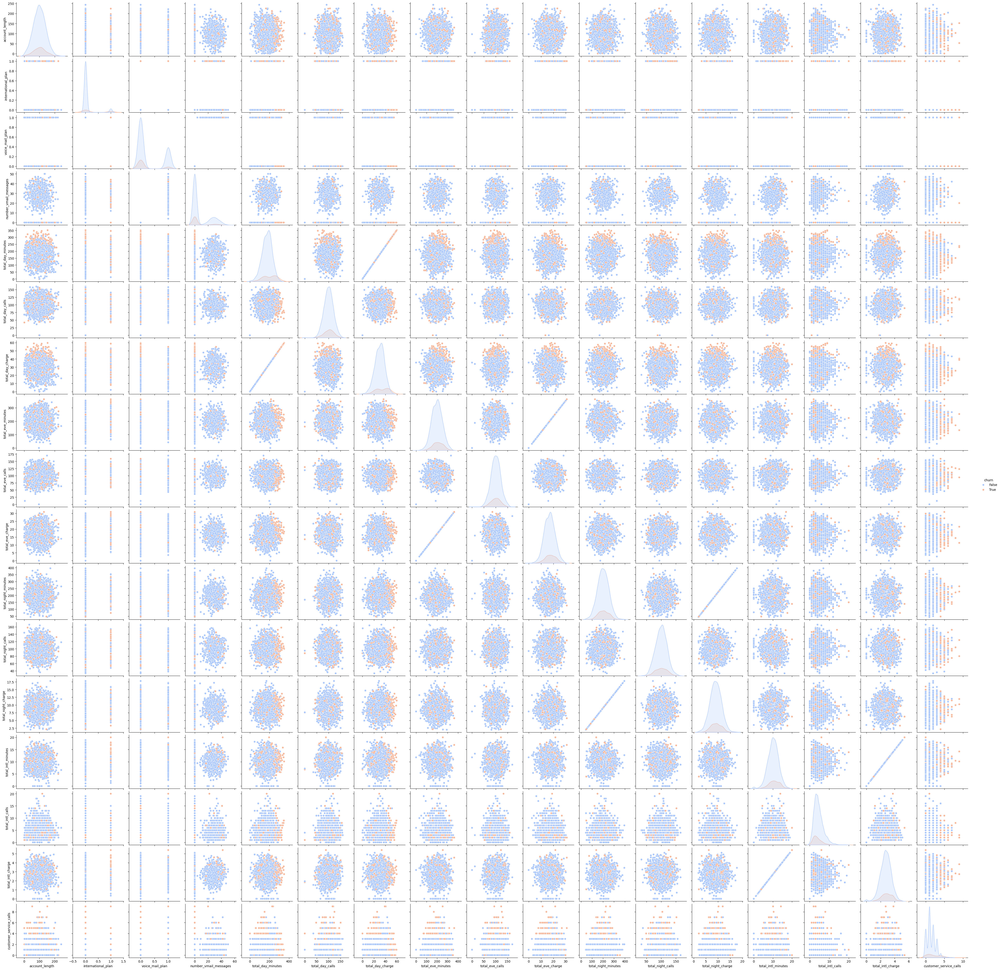

In [20]:
# plot a pairplot with "Churn" as hue to see the overall relationship between attributes

plt.figure(figsize=(20, 20))
sns.pairplot(df.select_dtypes(include=[np.number,'bool']), hue='churn', diag_kind='kde', palette='coolwarm')
plt.show()

- At first glance, there are several features that need to delve further for analysis (noticeably `daytime-related dimensions`, `customer service interaction`,...). Herein, I will divide into some main aspects of customer profile:
    + Demographics and Customer Tenure
    + Service Plan and Special Offerings
    + Usage Patterns/Behaviors
    + Charges and Billing
    + Customer Service Interaction

### 4.2.2 In-depth Bivariate Analysis

#### a. Demographics and Customer Tenure

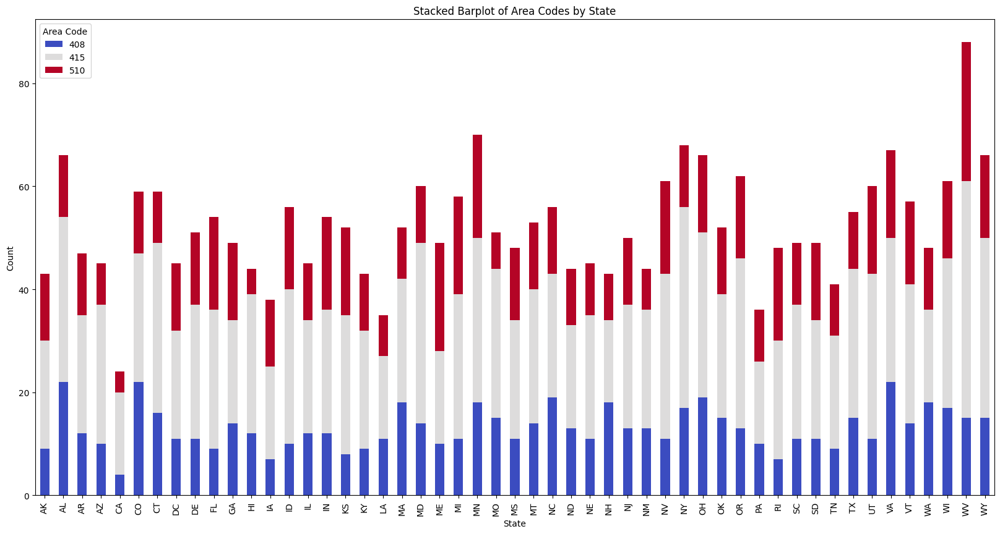

In [21]:
state_area_code_counts = df.groupby(['state', 'area_code']).size().unstack(fill_value=0)

state_area_code_counts.plot(kind='bar', stacked=True, figsize=(20, 10), colormap='coolwarm')

# Adding labels and title
plt.title('Stacked Barplot of Area Codes by State')
plt.xlabel('State')
plt.ylabel('Count')
plt.legend(title='Area Code')
plt.show()

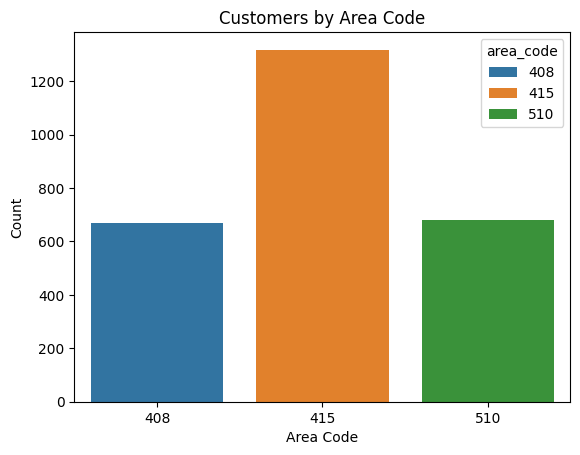

In [22]:
area_code = df['area_code'].value_counts().reset_index()

sns.barplot(x="area_code", y="count", data=area_code, hue="area_code", dodge=False)
plt.title('Customers by Area Code')
plt.xlabel('Area Code')
plt.ylabel('Count')
plt.show()

- There seems to be no relationship between area code and state. The distribution is pretty constant across all states, with 415 are code taking up the lion's share of users.
- **`WV state`** has apparently by far the most dominant figure of usages across all states.

> Therefore, no hierachial analysis can be performed, instead, we will delve into each of these two features seperately to figure out its relationship with churn rate

In [23]:
# plot the stacked distribution of churn rate across states and area codes

# Calculate proportion of churn for each state
state_churn = df.groupby(['state', 'churn']).size().unstack()
state_churn = state_churn.div(state_churn.sum(axis=1), axis=0)

# Calculate proportion of churn for each area code
area_code_churn = df.groupby(['area_code', 'churn']).size().unstack()
area_code_churn = area_code_churn.div(area_code_churn.sum(axis=1), axis=0)

# Plot for state churn
fig1 = go.Figure()
for col in state_churn.columns:
    fig1.add_trace(go.Bar(
        x=state_churn.index,
        y=state_churn[col],
        name=str(col)
    ))

fig1.update_layout(
    barmode='stack',
    title='Churn Rate by State (100% Stacked)',
    xaxis_title='State',
    yaxis_title='Proportion'
)

# Plot for area code churn
fig2 = go.Figure()
for col in area_code_churn.columns:
    fig2.add_trace(go.Bar(
        x=area_code_churn.index,
        y=area_code_churn[col],
        name=str(col)
    ))

fig2.update_layout(
    barmode='stack',
    title='Churn Rate by Area Code (100% Stacked)',
    xaxis_title='Area Code',
    yaxis_title='Proportion'
)

fig1.show()
fig2.show()

- States like (NJ, TX,) AR, MD, ME, MI, MS, PA, SC have high proportion of churned users, exceding the threshold set of over 20%
- No difference in Area Code >> This feature might be redundant

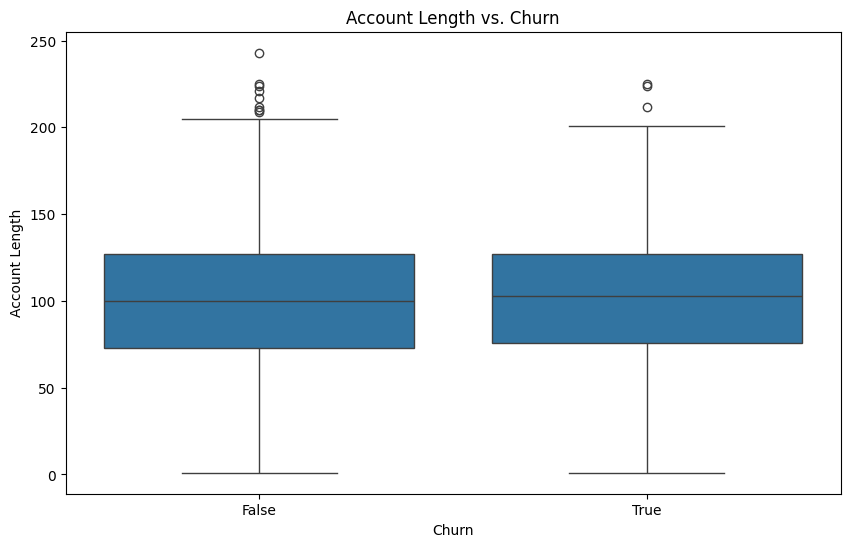

In [24]:
# Account Length vs. Churn
plt.figure(figsize=(10, 6))
sns.boxplot(x='churn', y='account_length', data=df)
plt.title('Account Length vs. Churn')
plt.xlabel('Churn')
plt.ylabel('Account Length')
plt.show()

In [25]:
# average account length by churn
df.groupby('churn')['account_length'].mean()

churn
False    100.330992
True     102.319588
Name: account_length, dtype: float64

In [26]:
import scipy.stats as stats

# Define a function to perform a two-sample t-test on any given column
def t_test_between_groups(df, column, group_col='churn', alpha=0.05):
    """
    Perform a t-test between two groups for a specific column.

    Parameters:
    - df: DataFrame containing the data
    - column: Column on which to perform the t-test
    - group_col: Column that defines the groups (default is 'churn')
    - alpha: Significance level for the t-test (default is 0.05)

    Returns:
    - t_stat: T-statistic value
    - p_value: P-value of the t-test
    - result: String indicating whether the difference is significant or not
    """

    group_1 = df[df[group_col] == True][column]
    group_2 = df[df[group_col] == False][column]

    # Perform a two-sample t-test
    t_stat, p_value = stats.ttest_ind(group_1, group_2, equal_var=False)

    # Interpret the result
    if p_value < alpha:
        result = f"The difference in {column} between the two groups of churn/non-churn is statistically significant."
    else:
        result = f"The difference in {column} between the two groups of churn/non-churn is not statistically significant."

    return t_stat, p_value, result

t_stat, p_value, result = t_test_between_groups(df, column='account_length')
print(f"T-statistic: {t_stat}, P-value: {p_value}")
print(result)

T-statistic: 0.9034071077460794, P-value: 0.36672644666852583
The difference in account_length between the two groups of churn/non-churn is not statistically significant.



---
<h5 style="font-size:22px; font-weight:bold; color:pink">🔹Key Findings: </h5>

- States like (NJ, TX,) AR, MD, ME, MI, MS, PA, SC have moderately higher proportion of churned users, exceding the threshold set of over 20%

- `Account length`: At first, with the hypothesis in mind that churned customers may have a shorter usage period (the longer the usage period the more loyal they tend to be). However, we cant tell from the mean length for both types that in reality, **Churned Users are even more inclined to having a longer account length**.
    + Also, after performing ttest, there is no significance difference between the two group >> Churned users can be both long or short-term users.
    + <a style="color:pink">Why is this the case? Are there any current issues/features repelling existing (potentially longterm) users? >> This require further analysis into comparison between previous and current offerings, reviewing made "modification" and perform further AB testing if necessary </a>


---


#### b. Service Plan and Special Offerings

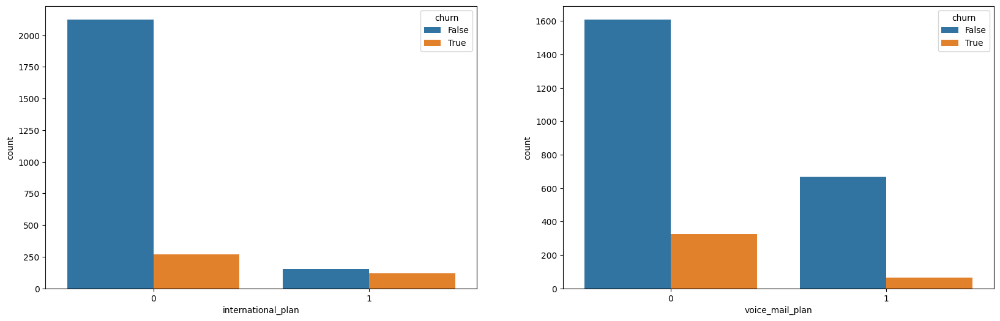

In [27]:
# International Plan, Voice Mail Plan vs. Churn

fig, axs = plt.subplots(1, 2, figsize=(20, 6))

sns.countplot(x='international_plan', hue='churn', data=df, ax=axs[0])
sns.countplot(x='voice_mail_plan', hue='churn', data=df, ax=axs[1])

plt.show()

<bound method Axes.legend of <Axes: title={'center': 'Voice Mail Plan vs Churn'}, xlabel='Voice Mail Plan', ylabel='Proportion'>>

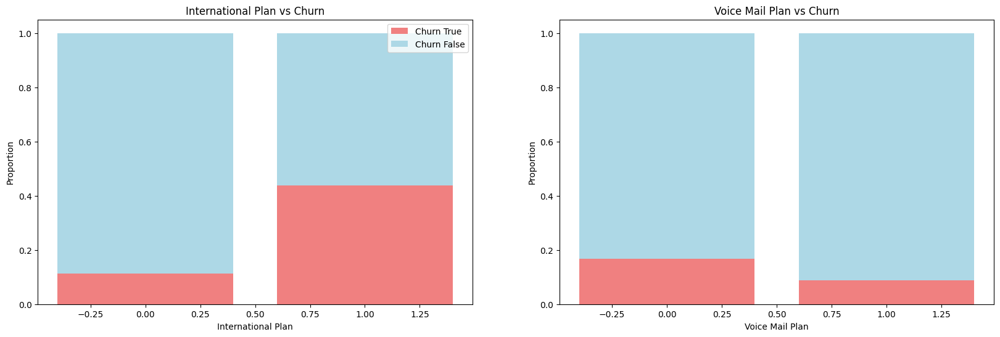

In [28]:
def calculate_proportions(df, feature):
    """calculate proportions of churn and non-churn for a given feature (each class summing to 100%)
    """
    feature_churn = df.groupby([feature, 'churn']).size().unstack().fillna(0)
    feature_churn = feature_churn.div(feature_churn.sum(axis=1), axis=0)
    return feature_churn

international_plan_churn = calculate_proportions(df, 'international_plan')
voice_mail_plan_churn = calculate_proportions(df, 'voice_mail_plan')

fig, axs = plt.subplots(1, 2, figsize=(20, 6))

# International Plan vs Churn (Stacked Bar)
axs[0].bar(international_plan_churn.index, international_plan_churn[True], label='Churn True', color='lightcoral')
axs[0].bar(international_plan_churn.index, international_plan_churn[False], bottom=international_plan_churn[True], label='Churn False', color='lightblue')
axs[0].set_title('International Plan vs Churn')
axs[0].set_xlabel('International Plan')
axs[0].set_ylabel('Proportion')
axs[0].legend()

# Voice Mail Plan vs Churn (Stacked Bar)
axs[1].bar(voice_mail_plan_churn.index, voice_mail_plan_churn[True], label='Churn True', color='lightcoral')
axs[1].bar(voice_mail_plan_churn.index, voice_mail_plan_churn[False], bottom=voice_mail_plan_churn[True], label='Churn False', color='lightblue')
axs[1].set_title('Voice Mail Plan vs Churn')
axs[1].set_xlabel('Voice Mail Plan')
axs[1].set_ylabel('Proportion')
axs[1].legend

In [29]:
t_stat, p_value, result = t_test_between_groups(df, column='international_plan')
print(f"T-statistic: {t_stat}, P-value: {p_value}")
print(result)

T-statistic: 9.907073979770438, P-value: 5.813590095090327e-21
The difference in international_plan between the two groups of churn/non-churn is statistically significant.


In [30]:
t_stat, p_value, result = t_test_between_groups(df, column='voice_mail_plan')
print(f"T-statistic: {t_stat}, P-value: {p_value}")
print(result)

T-statistic: -5.917124827074517, P-value: 5.506213778701384e-09
The difference in voice_mail_plan between the two groups of churn/non-churn is statistically significant.


---
<h5 style="font-size:22px; font-weight:bold; color:pink">🔹Key Insights - User/Non-user of International Plan and Voicemail: </h5>

- `Class = 0`: There seems to be no statistical difference in Churn rate proportions between non-users of Voice Mail Plan and International Plan
- `Class = 1`: However, when it comes to users of these special services, the discrepancy is clearly set:
    + For `international plan`, the proportion of churn accounts for nearly 50% >> Compared to only over 10% of non-users, this is a hugh surge, which may suggest issues with the current international phone service. **<a style="color:pink">Those who don't use it wouldn't know, but those who do are "very" dissatisfied with the service > easily leading to brand rejection.</a>**
    + For `Voice Mail Plan`, users of this service tend to be much more satisfied and form a more positive image of the brand, leading to a drop by half of customer churn proportion
    > <a style="color:pink">Voice mail figures suggest a positive performance, this service align with the customers' expectation </a>

    <br>
    <br>




    <i>P/S: Both difference between classes are backed by ttest to prove statistical significance </i>
---

In [31]:
# plot pie chart showing the pct of churned users that use international calls (international_plan=1) vs all churned users

px.pie(values=international_plan_churn[True], names=international_plan_churn.index, title='Churned Using International Plan vs. Total Churn',
       color=international_plan_churn.index, color_discrete_map={'True': 'lightcoral', 'False': 'lightblue'},
       hole=0.5, width=500, height=500)


---

<a style="color:pink"> Among those who have churned, a whopping 79.5% of them have actually used the service of international call. This raises some serious concern about the impact of this service on the retention rate of customers. </a>

We will have a granular look at the components of this service along with its customers' behaviors to detect the core reason of impact.

---

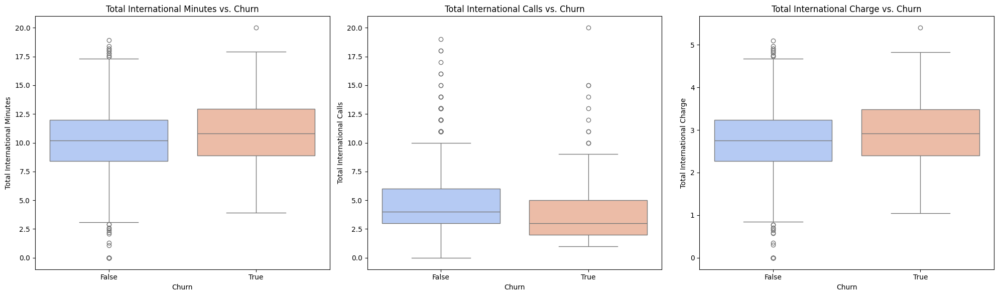

      total_intl_minutes                  total_intl_calls                   \
                    mean median       std             mean median       std   
churn                                                                         
False           10.13784   10.2  2.779622         4.538191    4.0  2.447533   
True            10.81933   10.8  2.771824         4.051546    3.0  2.468912   

      total_intl_charge                   
                   mean median       std  
churn                                     
False          2.737709   2.75  0.750441  
True           2.921727   2.92  0.748431  


In [32]:
# we will delve into the international call data attributes, including total international minutes, total international calls, and total international charge vs. churn

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

# Total International Minutes vs. Churn
sns.boxplot(x='churn', y='total_intl_minutes', data=df, ax=axs[0], palette='coolwarm')
axs[0].set_title('Total International Minutes vs. Churn')
axs[0].set_xlabel('Churn')
axs[0].set_ylabel('Total International Minutes')

# Total International Calls vs. Churn
sns.boxplot(x='churn', y='total_intl_calls', data=df, ax=axs[1], palette='coolwarm')
axs[1].set_title('Total International Calls vs. Churn')
axs[1].set_xlabel('Churn')
axs[1].set_ylabel('Total International Calls')

# Total International Charge vs. Churn
sns.boxplot(x='churn', y='total_intl_charge', data=df, ax=axs[2], palette='coolwarm')
axs[2].set_title('Total International Charge vs. Churn')
axs[2].set_xlabel('Churn')
axs[2].set_ylabel('Total International Charge')

plt.tight_layout()
plt.show()

churn_summary = df.groupby('churn')[['total_intl_minutes', 'total_intl_calls', 'total_intl_charge']].agg(['mean', 'median', 'std'])
print(churn_summary)

Text(0, 0.5, 'Count')

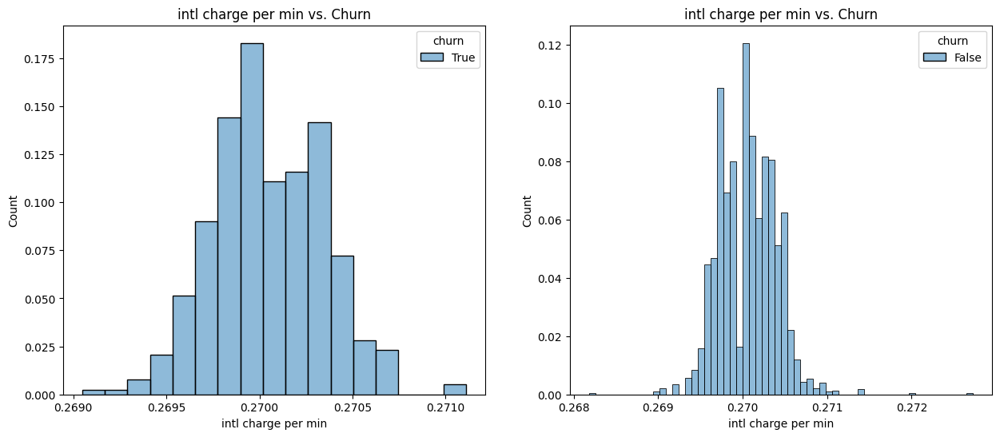

In [33]:
df["intl_charge_per_min"] = df["total_intl_charge"] / df["total_intl_minutes"]

# Plot histogram of intl charge per min vs. Churn
fig, ax = plt.subplots(1,2,figsize=(15, 6))

sns.histplot(x='intl_charge_per_min', hue='churn', data=df[df['churn'] == True], ax=ax[0], stat='proportion')
ax[0].set_title('intl charge per min vs. Churn')
ax[0].set_xlabel('intl charge per min')
ax[0].set_ylabel('Count')

sns.histplot(x='intl_charge_per_min', hue='churn', data=df[df['churn'] == False], ax=ax[1], stat='proportion')
ax[1].set_title('intl charge per min vs. Churn')
ax[1].set_xlabel('intl charge per min')
ax[1].set_ylabel('Count')

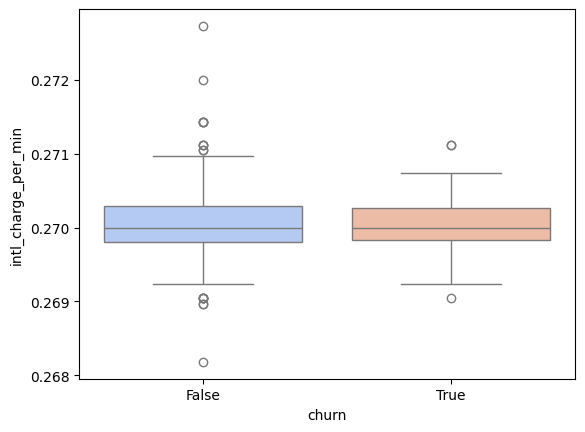

In [34]:
# Plot boxplot of intl charge per min vs. Churn
sns.boxplot(x='churn', y='intl_charge_per_min', data=df, palette='coolwarm')
plt.show()

In [35]:
print(df.groupby('churn')["intl_charge_per_min"].agg(['mean', 'median', 'std']))
print("\n")
print(f"T-test Result: {t_test_between_groups(df,'intl_charge_per_min')[2]}")

           mean  median       std
churn                            
False  0.270056    0.27  0.000337
True   0.270050    0.27  0.000300


T-test Result: The difference in intl_charge_per_min between the two groups of churn/non-churn is not statistically significant.


---
<h5 style="font-size:22px; font-weight:bold; color:pink">🔹Key Insights - Users of International Calls: </h5>

- `Total international minutes` and `charges` are slightly higher for churned customers, suggesting that **these customers are using the service more but might be dissatisfied with the costs or quality of the international service (cost - quality ratio), leading to churn.**

- `Total international calls` are lower for churned customers, which might indicate they are not utilizing the service fully or are reducing their usage before eventually churning. >> **This can also mean the issues encountered are noticeably disturbing for the group, triggering immediate dissatisfaction hence churn of some users.**

<a style="color:pink;font-size:24px">All of the aforementioned combined, we can draw some following insights of churned users:</a>

- Refined Insight:

    + Churned users tend to make **fewer international calls** but accumulate **more total minutes** and incur **higher charges** compared to non-churned users. Also, the narrower distribution of total international call per minute of churned users suggest a more sensitive attitude towards price variation, which might mean even a little change in price (more likely a disproprotionate increase when making a, let's say, longer call) would sway their behavior unfavorably.
    + In other words, it may also suggest that the **international service is better suited for short-duration calls**, as longer calls may lead to **disproportionate  costs**. Although higher rate for longer call might not be the core rationale, the unexpected variation in price may gravitate customers' experience towards the negative path, contributing to churn

- Suggested Solutions:

1. **Price Adjustment/Personalized Package**: To retain long-duration international callers, consider **adjusting the pricing structure** for extended international calls.
    + For example, predefining the cost rate for international call duration via offering certain packages beforehand may help avoid dissatisfaction.
    + Introducing pricing tiers or reducing the per-minute cost for longer calls (for example, reducing the cost after 10 minutes) could not only help address customer dissatisfaction but also increase satisfaction as it offers extended customer perceived value to some degree just as offering special packages or discounts for frequent international callers.

2. **Feature Engineering for Modeling**: For future machine learning modeling, a useful feature could be the ratio of **charges per minute**. This can provide insights into whether certain customers are being charged excessively for their usage.

   - **Discretization**: We can create a new feature by **discretizing** the charges/minutes per call ratio. This could highlight customers who are being charged significantly more for longer calls, helping the model predict churn more effectively.
   
   - **Threshold for Discretization**: Based on the current statistics of distribution:
     - **Low usage (affordable)**: charges/min <= 0.269
     - **Moderate usage (acceptable)**: 0.269<charges/min <=0.2705
     - **High usage (potentially high costs)**: charges/min > 0.2705

    > **Explanation:**

    - 0.2700 is the central point for both churned and non-churned users. But the variance in Churned Users is relatively narrower (tighter clustering)m, indicating that they are more **price-sensitive**. The slight variations above or below this threshold could signal where customers are more likely to experience dissatisfaction, making it useful for identifying at-risk customers.
    - Customers may perceive small price increases as unfair or disproportionate,

---

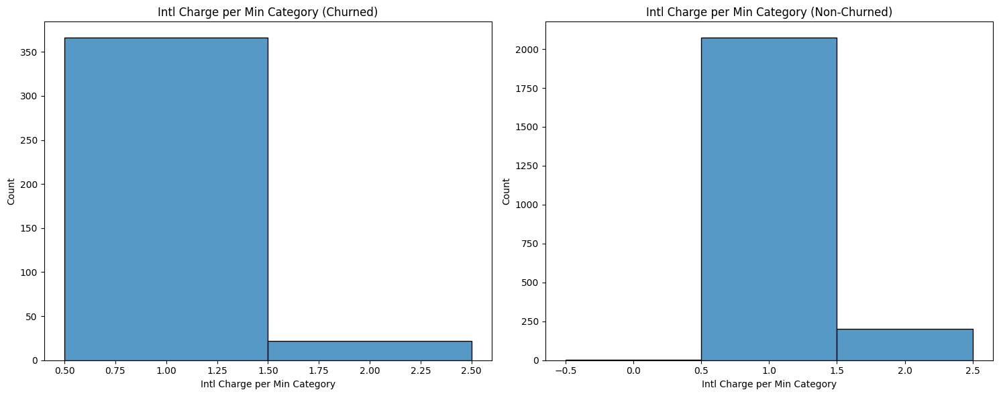

In [36]:
""" **Threshold for Discretization**: Based on the current statistics of distribution:
     - **Low usage (affordable)**: charges/min <= 0.269
     - **Moderate usage (acceptable)**: 0.269<charges/min <=0.2705
     - **High usage (potentially high costs)**: charges/min > 0.2705 """

df["intl_charge_per_min_cate"] = df["intl_charge_per_min"].apply(lambda x: 0 if x <= 0.269 else 1 if x <= 0.2705 else 2)

# Plot histograms
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Churned customers (True)
sns.histplot(x='intl_charge_per_min_cate', data=df[df['churn'] == True], ax=ax[0], discrete=True)
ax[0].set_title('Intl Charge per Min Category (Churned)')
ax[0].set_xlabel('Intl Charge per Min Category')
ax[0].set_ylabel('Count')

# Non-churned customers (False)
sns.histplot(x='intl_charge_per_min_cate', data=df[df['churn'] == False], ax=ax[1], discrete=True)
ax[1].set_title('Intl Charge per Min Category (Non-Churned)')
ax[1].set_xlabel('Intl Charge per Min Category')
ax[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

Text(0, 0.5, 'Count')

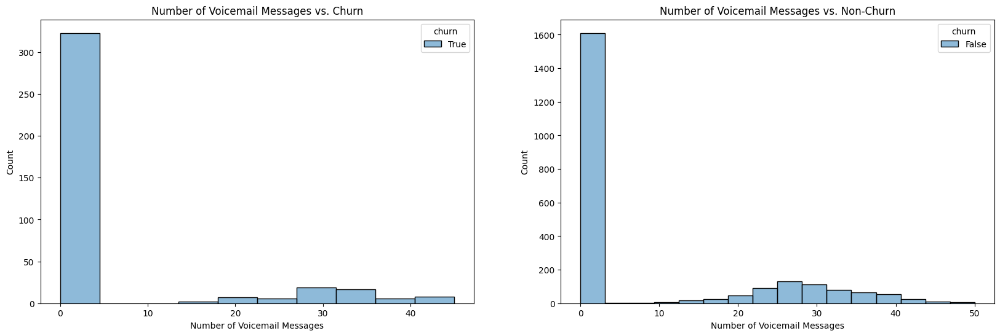

In [37]:
# Now, we will delve into the voicemail plan with the number of voicemail messages vs. churn

fig, axs = plt.subplots(1, 2, figsize=(20, 6))

# Number of Voicemail Messages vs Churn for Voicemail Plan Subscribers WITH HISTORGRAMS
sns.histplot(x='number_vmail_messages', hue='churn', data=df[df['churn'] == True], ax=axs[0], stat='count')
axs[0].set_title('Number of Voicemail Messages vs. Churn')
axs[0].set_xlabel('Number of Voicemail Messages')
axs[0].set_ylabel('Count')

sns.histplot(x='number_vmail_messages', hue='churn', data=df[df['churn'] == False], ax=axs[1], stat='count')
axs[1].set_title('Number of Voicemail Messages vs. Non-Churn')
axs[1].set_xlabel('Number of Voicemail Messages')
axs[1].set_ylabel('Count')

In [38]:
# plot pie chart showing the pct of churned users that use Voicemail Plan vs all churned users

px.pie(values=voice_mail_plan_churn[True], names=voice_mail_plan_churn.index, title='Churned Using Voicemail Plan vs. Total Churn',
       color=voice_mail_plan_churn.index, color_discrete_map={'True': 'lightcoral', 'False': 'lightblue'},
       hole=0.5, width=500, height=500)


Text(0, 0.5, 'Count')

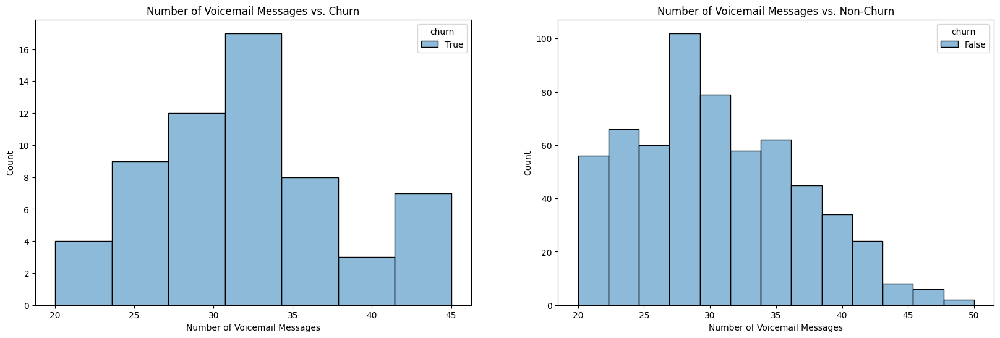

In [39]:
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

# Number of Voicemail Messages vs Churn for Voicemail Plan Subscribers WITH HISTORGRAMS
sns.histplot(x='number_vmail_messages', hue='churn', data=df[df['churn'] == True][df["number_vmail_messages"]>=20], ax=axs[0], stat='count')
axs[0].set_title('Number of Voicemail Messages vs. Churn')
axs[0].set_xlabel('Number of Voicemail Messages')
axs[0].set_ylabel('Count')

sns.histplot(x='number_vmail_messages', hue='churn', data=df[df['churn'] == False][df["number_vmail_messages"]>=20], ax=axs[1], stat='count')
axs[1].set_title('Number of Voicemail Messages vs. Non-Churn')
axs[1].set_xlabel('Number of Voicemail Messages')
axs[1].set_ylabel('Count')

In [40]:
voicemail_summary = df.groupby(['voice_mail_plan', 'churn'])['number_vmail_messages'].agg(['mean', 'median', 'std','max'])
print(voicemail_summary)

                            mean  median       std  max
voice_mail_plan churn                                  
0               False   0.000000     0.0  0.000000    0
                True    0.000000     0.0  0.000000    0
1               False  29.011976    29.0  7.563019   50
                True   30.861538    31.0  6.903072   45


---
<h5 style="font-size:22px; font-weight:bold; color:pink">🔹Key Insights - Users of Voice Mails & Number of Voicemails sent: </h5>
- Voicemail service usage does not seem to be a major contributor to churn, but those who use the service much more frequently (non-churned customers) tend to be more satisfied or engaged >> This could be a potential factor that results in loyalty

- Therefore, another feature can be generated vis-a-vis highly-active voicemail users with number of mails above a certain threshold (here it can be 45 - max for Churn voicemail users)
    + Multiple bins to discretize levels of voicemail acitivity:
        - Low activity: < 20 messages
        - Moderate activity: 20-35 messages
        - High activity: 35-45 messages
        - Very high activity: > 45 messages

---

### c. Usage Patterns/Behaviors

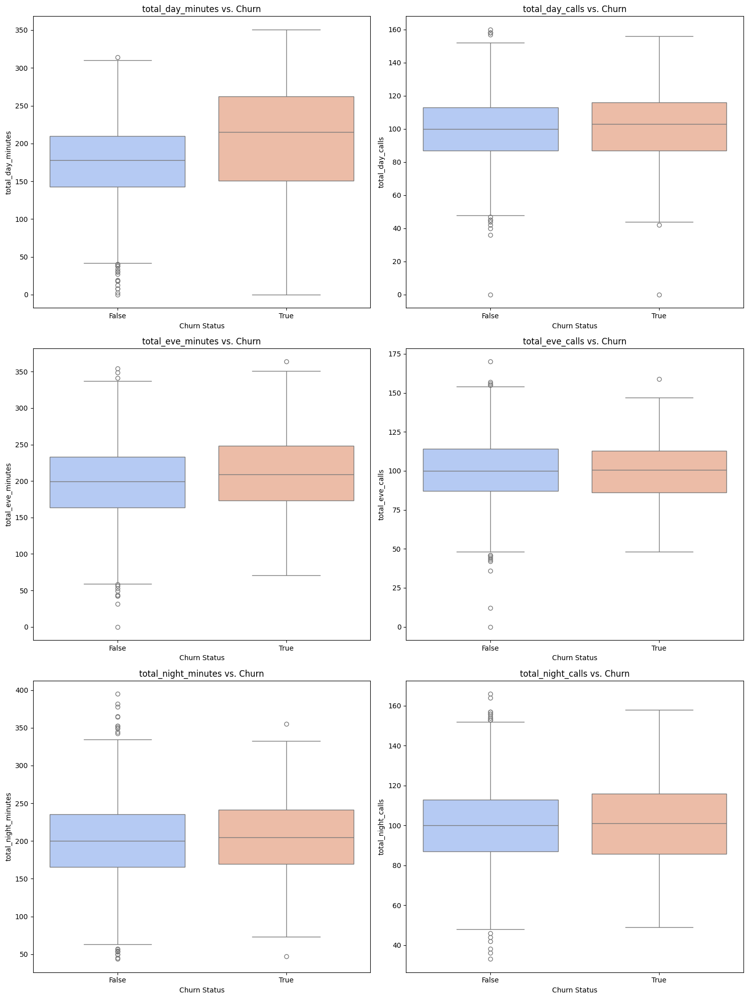

      total_day_minutes                    total_day_calls                    \
                   mean  median        std            mean median        std   
churn                                                                          
False        175.104346  177.90  50.105334      100.159350  100.0  19.681914   
True         205.181186  214.95  68.490213      101.195876  103.0  21.705279   

      total_eve_minutes                    total_eve_calls                    \
                   mean  median        std            mean median        std   
churn                                                                          
False        198.853380  199.55  50.818954      100.036435  100.0  20.258800   
True         209.385309  209.00  50.863718       99.948454  100.5  19.605474   

      total_night_minutes                    total_night_calls         \
                     mean  median        std              mean median   
churn                                               

In [41]:
# identify patterns of users' behaviours based on the number of minutes, calls they make domestically, categorized by Churn status

features = ['total_day_minutes', 'total_day_calls', 'total_eve_minutes', 'total_eve_calls',
            'total_night_minutes', 'total_night_calls']

# Plot distribution of features by churn status
fig, axs = plt.subplots(len(features)//2, 2, figsize=(15, 20))

for i, feature in enumerate(features):
    row, col = i // 2, i % 2
    sns.boxplot(x='churn', y=feature, data=df, ax=axs[row, col], palette='coolwarm')
    axs[row, col].set_title(f'{feature} vs. Churn')
    axs[row, col].set_xlabel('Churn Status')
    axs[row, col].set_ylabel(feature)

plt.tight_layout()
plt.show()

# Statistical summary
summary = df.groupby('churn')[features].agg(['mean', 'median', 'std'])
print(summary)


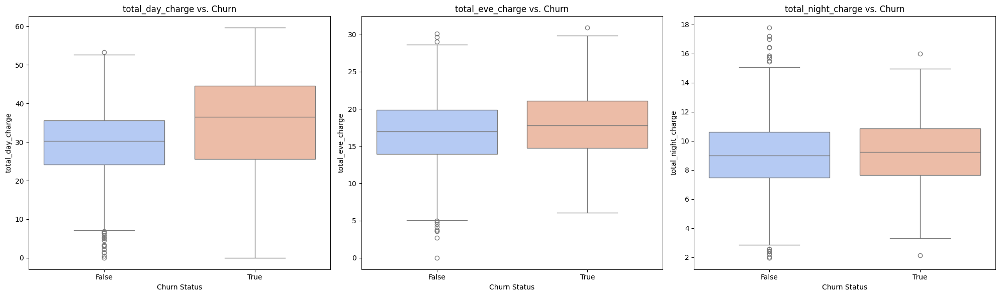

      total_day_charge                   total_eve_charge                    \
                  mean median        std             mean  median       std   
churn                                                                         
False        29.768266  30.24   8.517839        16.902809  16.965  4.319614   
True         34.881340  36.54  11.643479        17.797861  17.765  4.323327   

      total_night_charge                   
                    mean median       std  
churn                                      
False           9.020975  9.000  2.307779  
True            9.238892  9.225  2.140617  


In [42]:
# Now, we will look at the charges during 3 daily sessions

features = ['total_day_charge', 'total_eve_charge', 'total_night_charge']

fig, axs = plt.subplots(1, 3, figsize=(20, 6))  # Set to 1 row and 3 columns

for i, feature in enumerate(features):
    sns.boxplot(x='churn', y=feature, data=df, ax=axs[i], palette='coolwarm')
    axs[i].set_title(f'{feature} vs. Churn')
    axs[i].set_xlabel('Churn Status')
    axs[i].set_ylabel(feature)

plt.tight_layout()
plt.show()

# Statistical summary
summary = df.groupby('churn')[features].agg(['mean', 'median', 'std'])
print(summary)

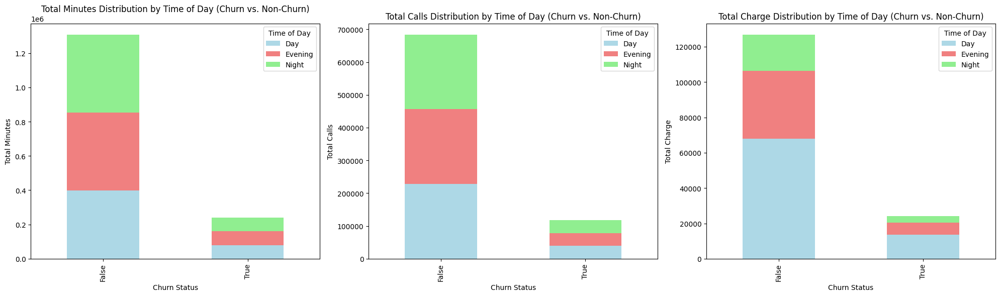

In [43]:
# we will generate two new columns for total calling minutes of the whole day and total calls of the whole day

df = df.assign(total_minutes=df['total_day_minutes'] + df['total_eve_minutes'] + df['total_night_minutes'])
df = df.assign(total_calls=df['total_day_calls'] + df['total_eve_calls'] + df['total_night_calls'])
df = df.assign(total_charge=df['total_day_charge'] + df['total_eve_charge'] + df['total_night_charge'])

# Aggregate the data by churn and breakdown by time of day (for minutes and calls)
agg_minutes = df.groupby('churn')[['total_day_minutes', 'total_eve_minutes', 'total_night_minutes']].sum()
agg_calls = df.groupby('churn')[['total_day_calls', 'total_eve_calls', 'total_night_calls']].sum()
agg_charge = df.groupby('churn')[['total_day_charge', 'total_eve_charge', 'total_night_charge']].sum()

fig, ax = plt.subplots(1, 3, figsize=(20, 6))

# Stacked bar chart for total minutes
agg_minutes.plot(kind='bar', stacked=True, ax=ax[0], color=['lightblue', 'lightcoral', 'lightgreen'])
ax[0].set_title('Total Minutes Distribution by Time of Day (Churn vs. Non-Churn)')
ax[0].set_xlabel('Churn Status')
ax[0].set_ylabel('Total Minutes')

# Stacked bar chart for total calls
agg_calls.plot(kind='bar', stacked=True, ax=ax[1], color=['lightblue', 'lightcoral', 'lightgreen'])
ax[1].set_title('Total Calls Distribution by Time of Day (Churn vs. Non-Churn)')
ax[1].set_xlabel('Churn Status')
ax[1].set_ylabel('Total Calls')

# Stacked bar chart for total charge
agg_charge.plot(kind='bar', stacked=True, ax=ax[2], color=['lightblue', 'lightcoral', 'lightgreen'])
ax[2].set_title('Total Charge Distribution by Time of Day (Churn vs. Non-Churn)')
ax[2].set_xlabel('Churn Status')
ax[2].set_ylabel('Total Charge')

ax[0].legend(title="Time of Day", labels=['Day', 'Evening', 'Night'])
ax[1].legend(title="Time of Day", labels=['Day', 'Evening', 'Night'])
ax[2].legend(title="Time of Day", labels=['Day', 'Evening', 'Night'])

plt.tight_layout()
plt.show()

---
<h5 style="font-size:22px; font-weight:bold; color:pink">🔹Key Insights - Number of Calls & Duration: </h5>

- Overall, each dimension of Day, Evening, and Night shares relatively equal proportion for both Churn and non-Churn group. There is no significant difference between churned and non-churned users in terms of the number of evening and night calls as well as evening and night total minutes.

- However, what stands out here is that even though the number of day calls for both groups are relatively similar in distribution (same number of calls, around 100 calls on average), Churned users have significantly higher total day minutes, hence much higher charges, compared to the other, as seen in both the boxplot and the summary statistics (mean total day min for the former is 205.18 while the latter's is 175.1).
    + **<a style="color:pink">Inference:</a>** The similarity in total day calls, but difference in total day minutes, suggests that churned users are making fewer but longer calls during the day **(or in other words, heavy daytime users may be more likely to churn, potentially due to dissatisfaction with the service quality and probably pricing during peak hours for longer call duration)**

---

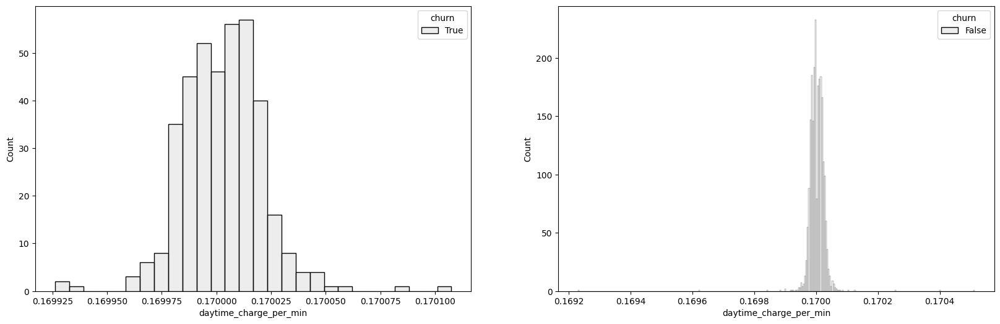

In [44]:
# Let's take a look at the daytime charge/minute for users of both group

df["daytime_charge_per_min"] = df["total_day_charge"] / df["total_day_minutes"]

# plot the distribution in histogram
fig, ax = plt.subplots(1, 2, figsize=(20, 6))

# plot the histogram for churn
sns.histplot(data=df[df["churn"]==True], x="daytime_charge_per_min", hue="churn", palette="coolwarm", ax=ax[0])

# plot the histogram for non churn
sns.histplot(data=df[df["churn"]==False], x="daytime_charge_per_min", hue="churn", palette="coolwarm", ax=ax[1])

plt.show()

---
- The distribution of daytime charge per minute for churned users is more concentrated between 0.1699 and 0.1701. This means that churned users are charged very similarly for daytime usage, with very little deviation in the rate per minute.
- This could suggest that pricing variability is not the main factor for churned users, but possibly other issues (i.e., service dissatisfaction or call quality during the day as I mentioned previously) could be contributing to their decision to churn, not the pricing
---

#### Multivariate Analysis - Average Charges/Account Day

In [45]:
df["avg_charge_per_acc_day"] = df["total_charge"] / df["account_length"]

# plot the distribution in boxplot
fig = px.box(df[df["avg_charge_per_acc_day"]<=2], x="churn", y="avg_charge_per_acc_day", color="churn",
             width=800, height=600)
fig.show()

In [46]:
print(df.groupby('churn')["avg_charge_per_acc_day"].agg(['mean', 'median', 'std', 'min', 'max']))

           mean    median       std       min    max
churn                                               
False  0.876957  0.559242  2.829162  0.145171  68.06
True   0.950967  0.606814  2.752919  0.172292  49.28


---
- Generally speaking, even though both churned and non-churned users share similar pattern in distribution of spending behavior, the average for churned users are still slightly higher than non-churned ones (by around 10% in charge)
---

### d. Customer Service Interaction

Text(0.5, 0, 'Customer Service Calls')

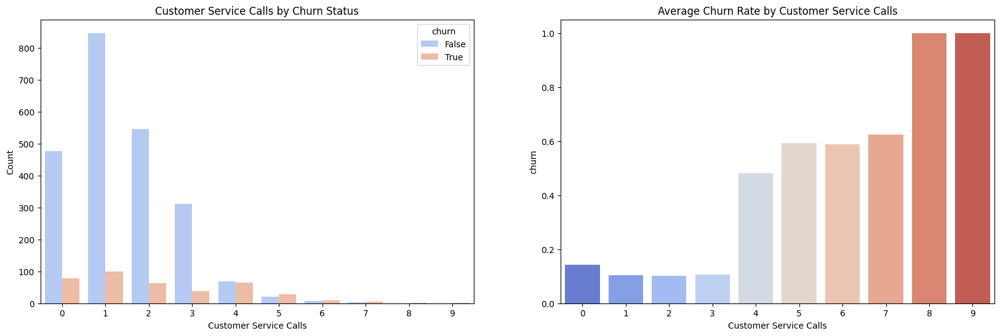

In [47]:
 # Churn rate by customer service calls

fig, ax = plt.subplots(1, 2, figsize=(20, 6))

sns.countplot(x='customer_service_calls', hue='churn', data=df, ax=ax[0], palette='coolwarm', dodge=True)
ax[0].set_title('Customer Service Calls by Churn Status')
ax[0].set_xlabel('Customer Service Calls')
ax[0].set_ylabel('Count')

sns.barplot(x='customer_service_calls', y='churn', data=df, ax=ax[1], palette='coolwarm',errorbar=None)
ax[1].set_title('Average Churn Rate by Customer Service Calls')
ax[1].set_xlabel('Customer Service Calls')

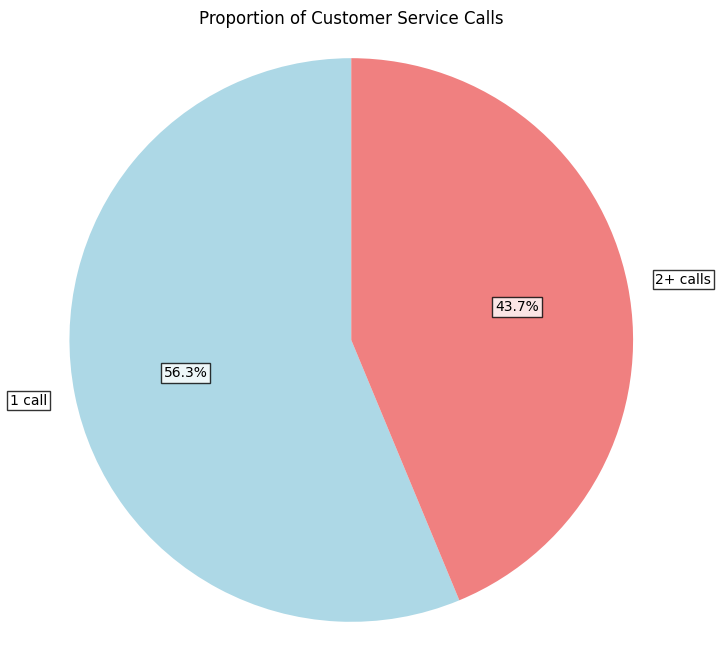

In [48]:
prop_calls = df['customer_service_calls'].apply(lambda x: '2+ calls' if x >= 2 else '1 call').value_counts(normalize=True)

plt.figure(figsize=(8, 8))
plt.pie(prop_calls.values, labels=prop_calls.index, autopct='%1.1f%%', startangle=90,
        colors=['lightblue', 'lightcoral'], textprops={'bbox': {'facecolor':'white', 'alpha':0.8, 'pad':2}})
plt.title('Proportion of Customer Service Calls')
plt.axis('equal')
plt.show()

---

<h5 style="font-size:22px; font-weight:bold; color:pink">🔹Key Insights - Customer Service Calls & Churn: </h5>

- **Customer Service Call Frequency**: A majority of non-churned users made **0 to 2 calls** to customer service, with churned users disproportionately represented in higher customer service call categories. As the number of customer service calls increases, the number of churned users rises significantly.
  
- **Churn Rate Correlation**: Churn rate remains relatively low for users making **0 to 3 calls**, but **increases drastically** from **4 customer service calls** onwards. By **7+ calls**, the churn rate approaches 100%, highlighting severe dissatisfaction among high-call customers.
  
- **<a style="color:pink">Inference:</a>**
    + High interaction with customer service (4+ calls) indicates unresolved issues leading to frustration and churn. Frequent customer service calls are a **strong predictor of churn**, especially beyond 4 calls.

    + **Discretizing customer service calls** into low (0-3), medium (4-6), and high (7-9) interaction categories will enhance the model’s ability to predict churn, as it captures user dissatisfaction and interaction intensity.

---

# 5. Feature Engineering

## 5.1 Comprehensive Review of Attributes

Since we have actually generated quite a few new features along the way, let's take a look at all of them together

In [49]:
print("All features/attributes to date:","; ".join(df.columns.values))
print("\n")

pd.set_option("display.max_columns",None)
df.head()

All features/attributes to date: state; account_length; area_code; international_plan; voice_mail_plan; number_vmail_messages; total_day_minutes; total_day_calls; total_day_charge; total_eve_minutes; total_eve_calls; total_eve_charge; total_night_minutes; total_night_calls; total_night_charge; total_intl_minutes; total_intl_calls; total_intl_charge; customer_service_calls; churn; intl_charge_per_min; intl_charge_per_min_cate; total_minutes; total_calls; total_charge; daytime_charge_per_min; avg_charge_per_acc_day




,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn,intl_charge_per_min,intl_charge_per_min_cate,total_minutes,total_calls,total_charge,daytime_charge_per_min,avg_charge_per_acc_day
0,KS,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,0.270000,1,707.2,300,72.86,0.170011,0.569219
1,OH,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,0.270073,1,611.5,329,55.54,0.169988,0.519065
2,NJ,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,0.269672,1,527.2,328,59.00,0.170008,0.430657
3,OH,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,0.269697,1,558.2,248,65.02,0.170007,0.774048
4,OK,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,0.270297,1,501.9,356,49.36,0.170006,0.658133


In [50]:
# So, all the new attributes to date are:

print(f"New attributes to-date: {';'.join(df.columns[-7:].values)}")

New attributes to-date: intl_charge_per_min;intl_charge_per_min_cate;total_minutes;total_calls;total_charge;daytime_charge_per_min;avg_charge_per_acc_day


## 5.2 Discretizing Predefined Attributes

For the number of `voicemails sent` and the number of `customer service calls`, discretization will be performed in accordance with the predefined rules I have set during EDA phase

In [51]:
"""
    + Multiple bins to discretize levels of voicemail acitivity:
        - Low activity: < 20 messages
        - Moderate activity: 20-35 messages
        - High activity: 35-45 messages
        - Very high activity: > 45 messages
"""

df["voicemail_engagement_lvl"] = df["number_vmail_messages"].apply(lambda x: 0 if x <= 20 else 1 if x <= 35 else 2 if x <= 45 else 3)

# Discretizing customer service calls into low (0-3), medium (4-6), and high (7-9) interaction categories

df["customer_service_freq_lvl"] = df["customer_service_calls"].apply(lambda x: 0 if x <= 3 else 1 if x <= 6 else 2)

df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn,intl_charge_per_min,intl_charge_per_min_cate,total_minutes,total_calls,total_charge,daytime_charge_per_min,avg_charge_per_acc_day,voicemail_engagement_lvl,customer_service_freq_lvl
0,KS,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,0.270000,1,707.2,300,72.86,0.170011,0.569219,1,0
1,OH,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,0.270073,1,611.5,329,55.54,0.169988,0.519065,1,0
2,NJ,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,0.269672,1,527.2,328,59.00,0.170008,0.430657,0,0
3,OH,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,0.269697,1,558.2,248,65.02,0.170007,0.774048,0,0
4,OK,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,0.270297,1,501.9,356,49.36,0.170006,0.658133,0,0


In [52]:
check_data(df)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
state,object,2666,51,0,0.0,2615
account_length,int64,2666,205,0,0.0,2461
area_code,category,2666,3,0,0.0,2663
international_plan,int32,2666,2,0,0.0,2664
voice_mail_plan,int32,2666,2,0,0.0,2664
number_vmail_messages,int64,2666,42,0,0.0,2624
total_day_minutes,float64,2666,1489,0,0.0,1177
total_day_calls,int64,2666,115,0,0.0,2551
total_day_charge,float64,2666,1489,0,0.0,1177
total_eve_minutes,float64,2666,1442,0,0.0,1224


## 5.3 Feature Normalization

<h3 style="color:pink;font-size:20px"> Since I am intent on utilizing Boosting Models - Decision Tree Based, specifically XGBoost or LightGBM, rescaling is not by far necessary since such algorithms are invariant to monotonic transformations of the features </h3>

In [53]:
# PLACEHOLDER IF NEEDED IN THE FUTURE

## 5.4 One-Hot Encoding Categorical Attributes

In [54]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(drop='first', sparse_output=False)

cols_encode = ['state', 'area_code']
df_encoded = encoder.fit_transform(df[cols_encode])

df_encoded = pd.DataFrame(df_encoded, columns=encoder.get_feature_names_out(cols_encode))

df_final = pd.concat([df, df_encoded], axis=1)

df_final.drop(cols_encode, axis=1, inplace=True)

df_final.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn,intl_charge_per_min,intl_charge_per_min_cate,total_minutes,total_calls,total_charge,daytime_charge_per_min,avg_charge_per_acc_day,voicemail_engagement_lvl,customer_service_freq_lvl,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,state_GA,state_HI,state_IA,state_ID,state_IL,state_IN,state_KS,state_KY,state_LA,state_MA,state_MD,state_ME,state_MI,state_MN,state_MO,state_MS,state_MT,state_NC,state_ND,state_NE,state_NH,state_NJ,state_NM,state_NV,state_NY,state_OH,state_OK,state_OR,state_PA,state_RI,state_SC,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area_code_415,area_code_510
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,0.270000,1,707.2,300,72.86,0.170011,0.569219,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,0.270073,1,611.5,329,55.54,0.169988,0.519065,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,0.269672,1,527.2,328,59.00,0.170008,0.430657,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,0.269697,1,558.2,248,65.02,0.170007,0.774048,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,0.270297,1,501.9,356,49.36,0.170006,0.658133,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


## 5.5 Feature Evaluation & Selection

### 5.5.1 Correlation Matrix

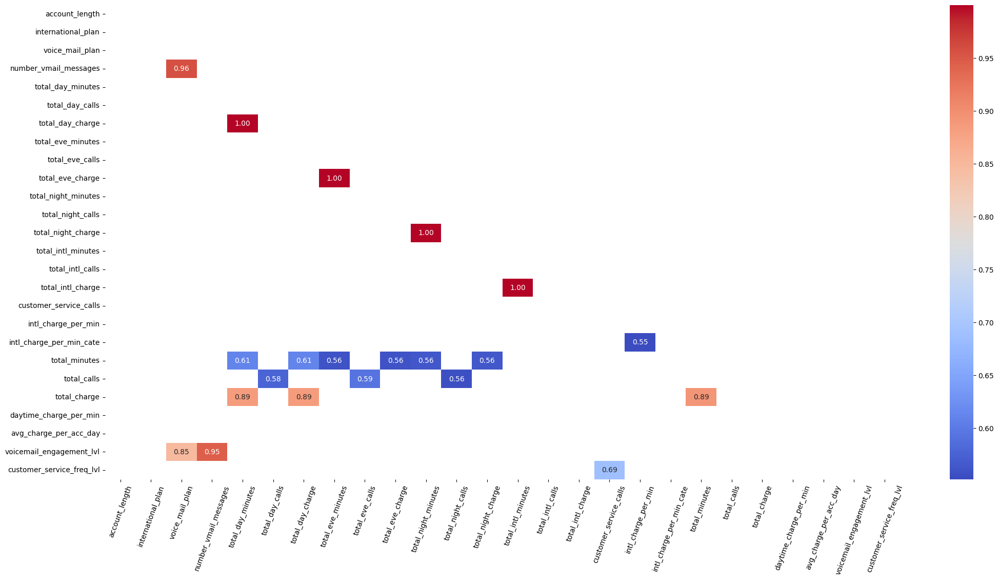

In [55]:
# plot correlation heatmap for numerical variables
mask = np.triu(np.ones_like(df.select_dtypes('number').corr(), dtype=bool))

# display only values > 0.5

plt.figure(figsize=(25, 12))
sns.heatmap(df.select_dtypes('number').corr()[df.select_dtypes('number').corr()>0.5], annot=True, fmt='.2f', cmap='coolwarm', mask=mask)
plt.xticks(rotation=70)
plt.show()

#### Tackling Multicollinearity

With a view to prevent multicollinearity in the model, attributes with noticeably high correlational value with others might be dropped as follows:

- `voice_mail_plan` and `number_vmail_messages` together generate `voicemail_engagement_lvl`. Given that `voice_mail_plan` display discrete Yes/No pattern of voicemail usage, the `number_vmail_messages` will be dropped first while the `voice_mail_plan` can be assessed later via the **Information Value Model**

- The same is also true for `customer_service_calls` and `customer_service_freq_lvl`, however the multicollinearity is less severe for these two

- Lastly, `total_charge` will be dropped since it displays high multicollinearity with `total_day_minutes`, `total_day_charge`, and `total_minutes`. However, the breakdown of the charge by time of the day can display some important non-linear pattern, therefore, they will be kept for now and tested the influence later

In [56]:
# drop number of vmail messages, total charge
df_final.drop(['number_vmail_messages','total_charge'], axis=1, inplace=True)

In [57]:
pd.set_option('display.max_rows', None)

check_data(df_final)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
account_length,int64,2666,205,0,0.0,2461
international_plan,int32,2666,2,0,0.0,2664
voice_mail_plan,int32,2666,2,0,0.0,2664
total_day_minutes,float64,2666,1489,0,0.0,1177
total_day_calls,int64,2666,115,0,0.0,2551
total_day_charge,float64,2666,1489,0,0.0,1177
total_eve_minutes,float64,2666,1442,0,0.0,1224
total_eve_calls,int64,2666,120,0,0.0,2546
total_eve_charge,float64,2666,1301,0,0.0,1365
total_night_minutes,float64,2666,1444,0,0.0,1222


### 5.5.2 Information Value Model

In [58]:
# change churn to 0 and 1
df_final['churn'] = df_final['churn'].map({False: 0, True: 1})


In [59]:
def calculate_woe_iv(df, feature, target, var_name=None):
    """
    Calculates WoE, IV values for a given feature and target variable
    """
    lst = []

    # Calculate the number of events and non-events
    total_events = df[target].sum()
    total_non_events = df[target].count() - total_events

    # Group by the feature and calculate event and non-event counts
    grouped = df.groupby(feature)[target].agg(['count', 'sum'])
    grouped.columns = ['total', 'events']
    grouped['non_events'] = grouped['total'] - grouped['events']

    # Calculate the distribution of events and non-events
    grouped['dist_events'] = grouped['events'] / total_events
    grouped['dist_non_events'] = grouped['non_events'] / total_non_events

    # Replace 0 values to avoid division by zero and log of zero
    grouped.replace({'dist_events': {0: 0.0001}, 'dist_non_events': {0: 0.0001}}, inplace=True)

    # Calculate WoE and IV
    grouped['WoE'] = np.log(grouped['dist_events'] / grouped['dist_non_events'])
    grouped['IV'] = (grouped['dist_events'] - grouped['dist_non_events']) * grouped['WoE']

    # Sum IV for the feature
    iv = grouped['IV'].sum()

    # Store the result with the correct variable name
    if var_name is None:
        var_name = feature
    lst.append({
        'Variable': var_name,
        'IV': iv
    })

    df_woe_iv = pd.DataFrame(lst)
    return df_woe_iv, grouped[['WoE']]


In [60]:
df_final_iv = df_final.copy()

In [61]:
def return_iv(df, target = 'churn', var_name=None):
    # Initialize iv_df
    iv_df = pd.DataFrame(columns=['Variable', 'IV'])

    features = df.columns.drop(target)

    for feature in features:
        # Skip the target variable
        if feature == target:
            continue

        # Determine if the feature is numerical
        if pd.api.types.is_numeric_dtype(df[feature]):
            # Bin numerical features
            if df[feature].nunique() > 10 and df[feature].dtype != 'bool':
                # Create a unique temporary bin column
                temp_bin_col = f'temp_bin_{feature}'
                df[temp_bin_col] = pd.qcut(df[feature], 10, duplicates='drop')
                feature_to_use = temp_bin_col
            else:
                feature_to_use = feature

            # Calculate WoE and IV, pass the original feature name
            iv, woe = calculate_woe_iv(df, feature_to_use, target, var_name=feature)
            iv_df = pd.concat([iv_df, iv], ignore_index=True)

            # Drop the temporary bin column if created
            if feature_to_use != feature:
                df.drop(columns=[feature_to_use], inplace=True)
        else:
            # For categorical variables
            iv, woe = calculate_woe_iv(df, feature, target)
            iv_df = pd.concat([iv_df, iv], ignore_index=True)


    iv_df.sort_values('IV', ascending=False, inplace=True)
    return iv_df

return_iv(df_final_iv)


,Variable,IV
3,total_day_minutes,0.655953
5,total_day_charge,0.655953
15,customer_service_calls,0.563057
18,total_minutes,0.535617
23,customer_service_freq_lvl,0.535085
1,international_plan,0.429781
8,total_eve_charge,0.094372
6,total_eve_minutes,0.093106
2,voice_mail_plan,0.090962
14,total_intl_charge,0.081906


#### IV Score Evaluation Reference

<center>
<img src='IV_score_reference.jpg' width=600>
</center>

---
<h4 style="font-size:22px; font-weight:bold; color:pink">🔹 Quick Insights: </h4>

- Seemingly, state and area code (geographical attributes) only, as expected in the first place, bring little value to the prediction. Unless this has potential interactive influence on the target attribute, I will drop these later.

- In addition, `customer_service_calls` does have great influence on the prediciton model, hence, keeping this is essential. By contrast, `voice_mail_plan` is a weak predictor. I will keep it for several runs of models to see if it can contribute by interacting with other attributes. Otherwise, it would be dropped

- I would also pay attention to `intl_charge_per_min_cate`, `total_eve_calls`, and `account_length` because individually, these attributes are deemed unuseful predictors.
---


In [62]:
# drop all states and area codes
cols_state_area = df_final.columns[df_final.columns.str.contains('state|area_code')]

df_final_v2 = df_final.drop(columns=cols_state_area)
df_final_v2 = df_final_v2.drop(columns=['voice_mail_plan', 'intl_charge_per_min_cate', 'total_eve_calls', 'account_length'])

df_final_v2.columns

Index(['international_plan', 'total_day_minutes', 'total_day_calls',
       'total_day_charge', 'total_eve_minutes', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'customer_service_calls', 'churn', 'intl_charge_per_min',
       'total_minutes', 'total_calls', 'daytime_charge_per_min',
       'avg_charge_per_acc_day', 'voicemail_engagement_lvl',
       'customer_service_freq_lvl'],
      dtype='object')

In [63]:
return_iv(df_final_v2).reset_index(drop=True)

,Variable,IV
0,total_day_minutes,0.655953
1,total_day_charge,0.655953
2,customer_service_calls,0.563057
3,total_minutes,0.535617
4,customer_service_freq_lvl,0.535085
5,international_plan,0.429781
6,total_eve_charge,0.094372
7,total_eve_minutes,0.093106
8,total_intl_minutes,0.081906
9,total_intl_charge,0.081906


In [78]:
# export preprocessed testing data for dataset1_20.csv
# df_final.to_csv('churn_preprocessed_test_v1.csv', index=False)
# df_final_v2.to_csv('churn_preprocessed_test_v2.csv', index=False)

# 6. Model Selection

## 🔹 Overview - Model Development Pipeline

---

After taking features with a grain of salt via Feature Engineering phase, this section from now on will be dedicated to constructing a complete Machine Learning Model for deployment. Listed below are the step-by-step procedure that will be executed:

1. <a style="color:pink">Shortlisting most appropriate ML Models</a>: Consider Ensemble Learning Models, most likely XGBoost and LightBGM, to tackle class majority bias and avoid overfitting with breadth-first decision tree algorithms.

2. <a style="color:pink">Assessing the necessity of Resampling to tackle Class Imbalance</a>: Placeholding SMOTE upsampling method for later use if needed.

3. <a style="color:pink">Generating 2 seperate versions of both training and holdout datasets for later assessment</a>: 2 final seperate datasets after EDA with different sets of features will be tested on to evaluate the needs of some features (specifically: `voice_mail_plan`, `intl_charge_per_min_cate`, `total_eve_calls`, `account_length`)

4. <a style="color:pink">Tuning Hyper-Parameters with Grid Search CV</a>: Grid Search with built-in hyperparameters are implemented instead of Bayesian Search for the reason of time limitation and efficiency

5. <a style="color:pink">Fitting Optimized Models with each dataset version

6. <a style="color:pink">Comparing and Assessing Performance Metrics</a>: Comparing evaluation metrics (ROC AUC or precision-recall due to class imbalance).

7. <a style="color:pink">Preliminary Feature Adjustment for Final Deployment</a>: Refine final subset of features before final deployment

8. <a style="color:pink">Final Model Implementation with BayesSearch CV & Interpretation </a>: Run Bayes Search CV for the final model for maximal optimization of hyper-params before deployment


---



## 6.1 Why is Upsampling Not Necessary with My Model Selection?

In [ ]:
churn_class_pct = df_final["churn"].value_counts()

# plot pie chart

fig=px.pie(names=churn_class_pct.index, values=churn_class_pct.values, hole=0.3, color_discrete_sequence=['pink', 'green'],
           width=800, height=500)

fig.update_layout(
    plot_bgcolor='black',
    paper_bgcolor='black',
    font_color='white'
)

**<h4 style="color:pink;font-size:30">Reasons for Shortlisting LightGBM and XGBoost:</h4>**

1. **Scalability and Robustness for Large Datasets:** As the customer base in the telecommunications industry grows, datasets may scale from medium to large. LightGBM and XGBoost are robust algorithms designed to handle large-scale data efficiently, making them suitable for this context. Also, these 2 models are efficient in handling high-dimensional datasets

2. **Effective Handling of Class Imbalance:** The target variable `churn` exhibits significant class imbalance. Both models offer parameters like `scale_pos_weight` (XGBoost) and `is_unbalance` or `scale_pos_weight` (LightGBM) to address this issue, minimizing bias toward the majority class.

3. **Prevention of Overfitting through Regularization:** Built-in regularization techniques in both models help prevent overfitting, enhancing the model's ability to generalize to new data.

4. **Capturing Complex Nonlinear Relationships:** As powerful gradient boosting algorithms, they excel at modeling complex nonlinear patterns in data, often outperforming other classification methods.

5. **Efficient Training with Parallel and Distributed Computing:** Support for parallel computing and distributed training accelerates the training process, making them efficient for large datasets.

6. **Insightful Feature Importance Scores:** Both models provide feature importance metrics, helping identify the most influential factors contributing to customer churn, which is valuable for strategic decision-making.

<a style="color:pink"> Although there is an obvious class imbalance, resampling approach (such as SMOTE upsampling for the minority) is not necessary because LightGB and XGBoost have built-in parameters to deal with it (`scale_pos_weight`) </a>

## 6.2 Train, Holdout Dataset Load

In [ ]:
# 1st version with all attributes to date

# define train dataset
X_train = df_final.drop(columns=['churn'])
y_train = df_final['churn']

# define holdout dataset
test_data = pd.read_csv('churn_preprocessed_test_v1.csv')
X_test = test_data.drop(columns=['churn'])
y_test = test_data['churn']

In [ ]:
# 2nd version with other low iv score attributes (geographical info, 'voice_mail_plan', 'intl_charge_per_min_cate', 'total_eve_calls', 'account_length') being dropped

# define train dataset
X_train_v2 = df_final_v2.drop(columns=['churn'])
y_train_v2 = df_final_v2['churn']

# define holdout dataset
test_data_v2 = pd.read_csv('churn_preprocessed_test_v2.csv')
X_test_v2 = test_data_v2.drop(columns=['churn'])
y_test_v2 = test_data_v2['churn']

## 6.3 Fitting Models w/ CV Grid Search -  LightGBM vs. XGBoost

### a. Fitting Dataset Ver 1 (Comprehensive)

In [82]:
# import model libraries
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
# Calculate scale_pos_weight to handle class imbalance
negative_count = np.sum(y_train == 0)
positive_count = np.sum(y_train == 1)
scale_pos_weight = negative_count / positive_count

# Define parameter grids for GridSearchCV
param_grid_xgb = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1],
    'scale_pos_weight': [scale_pos_weight],
    'gamma': [0, 1],
    'min_child_weight': [1, 5]
}

param_grid_lgbm = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7, -1],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1],
    'scale_pos_weight': [scale_pos_weight],
    'reg_alpha': [0, 1], #L1
    'reg_lambda': [0, 1], #L2
    'min_child_weight': [1, 5]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Build Model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
lgbm_model = LGBMClassifier(random_state=42)

# Set up GridSearchCV for XGBoost
grid_search_xgb = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid_xgb,
    scoring='roc_auc',
    cv=cv,
    n_jobs=-1,
    verbose=1
)

# Set up GridSearchCV for LightGBM
grid_search_lgbm = GridSearchCV(
    estimator=lgbm_model,
    param_grid=param_grid_lgbm,
    scoring='roc_auc',
    cv=cv,
    n_jobs=-1,
    verbose=1
)

# Fit the models
grid_search_xgb.fit(X_train, y_train)
grid_search_lgbm.fit(X_train, y_train)

# Get the best estimators
best_xgb = grid_search_xgb.best_estimator_
best_lgbm = grid_search_lgbm.best_estimator_

# Evaluate XGBoost on test set
y_pred_xgb = best_xgb.predict(X_test)
y_pred_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
roc_auc_xgb = roc_auc_score(y_test, y_pred_proba_xgb)

# Evaluate LightGBM on test set
y_pred_lgbm = best_lgbm.predict(X_test)
y_pred_proba_lgbm = best_lgbm.predict_proba(X_test)[:, 1]

accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)
roc_auc_lgbm = roc_auc_score(y_test, y_pred_proba_lgbm)

model_comparison = pd.DataFrame({
    'Model': ['XGBoost', 'LightGBM'],
    'Accuracy': [accuracy_xgb, accuracy_lgbm],
    'ROC AUC': [roc_auc_xgb, roc_auc_lgbm]
})

print(model_comparison)


Fitting 5 folds for each of 192 candidates, totalling 960 fits
Fitting 5 folds for each of 512 candidates, totalling 2560 fits
[LightGBM] [Info] Number of positive: 388, number of negative: 2278
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3491
[LightGBM] [Info] Number of data points in the train set: 2666, number of used features: 76
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145536 -> initscore=-1.770048
[LightGBM] [Info] Start training from score -1.770048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

### b. Fitting Dataset Ver 2 (w/ Dimension Reduction)

In [ ]:
# Calculate scale_pos_weight to handle class imbalance
negative_count_v2 = np.sum(y_train_v2 == 0)
positive_count_v2 = np.sum(y_train_v2 == 1)
scale_pos_weight_v2 = negative_count_v2 / positive_count_v2

# Define parameter grids for GridSearchCV
param_grid_xgb_v2 = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1],
    'scale_pos_weight': [scale_pos_weight_v2],
    'gamma': [0, 1],
    'min_child_weight': [1, 5]
}

param_grid_lgbm_v2 = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7, -1],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1],
    'scale_pos_weight': [scale_pos_weight_v2],
    'reg_alpha': [0, 1], #L1
    'reg_lambda': [0, 1], #L2
    'min_child_weight': [1, 5]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Build Model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
lgbm_model = LGBMClassifier(random_state=42)

# Set up GridSearchCV for XGBoost
grid_search_xgb_v2 = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid_xgb_v2,
    scoring='roc_auc',
    cv=cv,
    n_jobs=-1,
    verbose=1
)

# Set up GridSearchCV for LightGBM
grid_search_lgbm_v2 = GridSearchCV(
    estimator=lgbm_model,
    param_grid=param_grid_lgbm_v2,
    scoring='roc_auc',
    cv=cv,
    n_jobs=-1,
    verbose=1
)

# Fit the models
grid_search_xgb_v2.fit(X_train_v2, y_train_v2)
grid_search_lgbm_v2.fit(X_train_v2, y_train_v2)

# Get the best estimators
best_xgb_v2 = grid_search_xgb_v2.best_estimator_
best_lgbm_v2 = grid_search_lgbm_v2.best_estimator_

# Evaluate XGBoost on test set
y_pred_xgb_v2 = best_xgb_v2.predict(X_test_v2)
y_pred_proba_xgb_v2 = best_xgb_v2.predict_proba(X_test_v2)[:, 1]

accuracy_xgb_v2 = accuracy_score(y_test_v2, y_pred_xgb_v2)
roc_auc_xgb_v2 = roc_auc_score(y_test_v2, y_pred_proba_xgb_v2)

# Evaluate LightGBM on test set
y_pred_lgbm_v2 = best_lgbm_v2.predict(X_test_v2)
y_pred_proba_lgbm_v2 = best_lgbm_v2.predict_proba(X_test_v2)[:, 1]

accuracy_lgbm_v2 = accuracy_score(y_test_v2, y_pred_lgbm_v2)
roc_auc_lgbm_v2 = roc_auc_score(y_test_v2, y_pred_proba_lgbm_v2)

model_comparison_v2 = pd.DataFrame({
    'Model': ['XGBoost', 'LightGBM'],
    'Accuracy': [accuracy_xgb_v2, accuracy_lgbm_v2],
    'ROC AUC': [roc_auc_xgb_v2, roc_auc_lgbm_v2]
})

print(model_comparison_v2)


Fitting 5 folds for each of 192 candidates, totalling 960 fits
Fitting 5 folds for each of 512 candidates, totalling 2560 fits
[LightGBM] [Info] Number of positive: 388, number of negative: 2278
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3091
[LightGBM] [Info] Number of data points in the train set: 2666, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145536 -> initscore=-1.770048
[LightGBM] [Info] Start training from score -1.770048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

### c. Comparing Models

In [ ]:
# plot the model comparison with dataset ver 1

fig = px.scatter(model_comparison, x='Model', y=['Accuracy', 'ROC AUC'], title='Model Comparison',
                 width=800, height=500)
fig.show()

In [ ]:
# plot the model comparison with dataset ver 2

fig = px.scatter(model_comparison_v2, x='Model', y=['Accuracy', 'ROC AUC'], title='Model Comparison',
                 width=800, height=500)
fig.show()

### d. Conclusion - LightGBM Chosen

- <a style="color:pink">v/v Dataset Version 1 (including geographical attributes, 'voice_mail_plan', 'intl_charge_per_min_cate', 'total_eve_calls', 'account_length') vs. Dataset Version 2 (with more dimensional reduction)</a>:
    + With the first dataset, the model returns a slightly better result, especially with the XGBoost Model.
    + However the results remain nearly the same across both dataset with LightGBM Model

- <a style="color:pink">v/v Model Comparison (XGBoost vs. LightGBM): </a>
    + Aside from a faster/more efficient training time of LightGBM, the model outperforms the XGBoost model to a certain extent, notably in the version 2 dataset.
    + Also, the model requires less training time, which makes lgbm more efficient when upscaling with larger datasets overtime


- It can be deduced that even though both models are effective in handling high-dimensional datasets, the LightGBM may be able to extract more complex relationships among attributes, therefore having a more consistent result

> **P/S: ROC AUC metric was appropriate and highly favored for imbalanced dataset among classes, therefore, chosen as the pivotal evaluation metrics (`scoring`) for the model overall evaluation aside accuracy**

<p style="color:pink;font-size=50"> LightGBM will be officially chosen as the final model </p>

## 6.4 Preliminary Feature Importance Evaluation

In [93]:
def show_feature_importance(model, X):
    feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
    feature_importance.sort_values(by='Importance', ascending=False, inplace=True)
    feature_importance.reset_index(drop=True, inplace=True)
    feature_importance

    plt.figure(figsize=(10, 5))
    fig = px.line(x=feature_importance['Feature'], y=feature_importance['Importance'], markers="o",title="Feature Importance",template="plotly_dark",color_discrete_sequence=['pink'])
    fig.update_layout(
        xaxis_title="Feature",
        yaxis_title="Importance",
        font={"family":"Arial", "size":12})

    fig.update_xaxes(tickangle=60)

    fig.show()

In [ ]:
# first dataset v1
show_feature_importance(best_lgbm_v2, X_train_v2)

<Figure size 1000x500 with 0 Axes>

In [ ]:
# second dataset v2
show_feature_importance(best_lgbm, X_train)

<Figure size 1000x500 with 0 Axes>

---
<h4 style="font-size:22px; font-weight:bold; color:pink">🔹Key Takeaways </h4>

1. **Comment on Expectation**:
    - As expected along the EDA process as well as with the Information Value Model, georaphical values bare little to almost no influence at all on the target variables. Apart from that, `voice_mail_plan` and `intl_charge_per_min` also have little impact, which can be officially dropped for the final model before deployment.

    - Otherwise, `total_eve_calls` and `account_length` do have moderate positive impact on the model, which mean they can be officially kept
---

# 7. Final Model Deployment & Interpretation

Load final versions of datasets with adjustment from preliminary feature importance evaluation

In [79]:
# Load final versions of datasets
cols_state_area = df_final.columns[df_final.columns.str.contains('state|area_code')]

df_final_v3 = df_final.drop(columns=cols_state_area)
df_final_v3 = df_final_v3.drop(columns=['voice_mail_plan', 'intl_charge_per_min_cate'])

# df_final_v3.to_csv('churn_preprocessed_test_final.csv', index=False)

# define train dataset
X_train_final = df_final_v3.drop(columns=['churn'])
y_train_final = df_final_v3['churn']

# define holdout dataset
test_data_v3 = pd.read_csv('churn_preprocessed_test_final.csv')
X_test_final = test_data_v3.drop(columns=['churn'])
y_test_final = test_data_v3['churn']

In [80]:
# !pip install scikit-optimize

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 3.1 MB/s eta 0:00:00


In [ ]:
from skopt import BayesSearchCV
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, classification_report

# Calculate scale_pos_weight to handle class imbalance
negative_count_final = np.sum(y_train_final == 0)
positive_count_final = np.sum(y_train_final == 1)
scale_pos_weight_final = negative_count_final / positive_count_final

# Define parameter space for BayesSearchCV
param_space_lgbm_final = {
    'n_estimators': (100, 200),
    'max_depth': (3, 7),
    'learning_rate': (0.01, 0.1, 'log-uniform'),
    'subsample': (0.8, 1),
    'colsample_bytree': (0.8, 1),
    'scale_pos_weight': (scale_pos_weight_final,),
    'reg_alpha': (0, 1),
    'reg_lambda': (0, 1),
    'min_child_weight': (1, 5)
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
lgbm_model = LGBMClassifier(random_state=42)

# Set up BayesSearchCV
bayes_search_lgbm_final = BayesSearchCV(
    estimator=lgbm_model,
    search_spaces=param_space_lgbm_final,
    scoring='roc_auc',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)

# Fit the model
bayes_search_lgbm_final.fit(X_train_final, y_train_final)

# Get the best estimator
best_lgbm_final = bayes_search_lgbm_final.best_estimator_

# Evaluate LightGBM on test set
y_pred_lgbm_final = best_lgbm_final.predict(X_test_final)
y_pred_proba_lgbm_final = best_lgbm_final.predict_proba(X_test_final)[:, 1]

accuracy_lgbm_final = accuracy_score(y_test_final, y_pred_lgbm_final)
roc_auc_lgbm_final = roc_auc_score(y_test_final, y_pred_proba_lgbm_final)
f1_score_lgbm_final = f1_score(y_test_final, y_pred_lgbm_final)

model_performance_final = pd.DataFrame({
    'Model': ['LightGBM'],
    'Accuracy': [accuracy_lgbm_final],
    'ROC AUC': [roc_auc_lgbm_final],
    'f1_score': [f1_score_lgbm_final]
})

print(model_performance_final)


In [90]:
print(model_performance_final)

      Model  Accuracy   ROC AUC  f1_score
0  LightGBM  0.947526  0.927567  0.818653


In [88]:
best_lgbm_final

LGBMClassifier(colsample_bytree=0.8, learning_rate=0.05946682769647679,
               max_depth=4, min_child_weight=3, n_estimators=200,
               random_state=42, reg_alpha=0, reg_lambda=0,
               scale_pos_weight=5.871134020618556)

In [87]:
print(classification_report(y_test_final, y_pred_lgbm_final))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       572
           1       0.81      0.83      0.82        95

    accuracy                           0.95       667
   macro avg       0.89      0.90      0.89       667
weighted avg       0.95      0.95      0.95       667



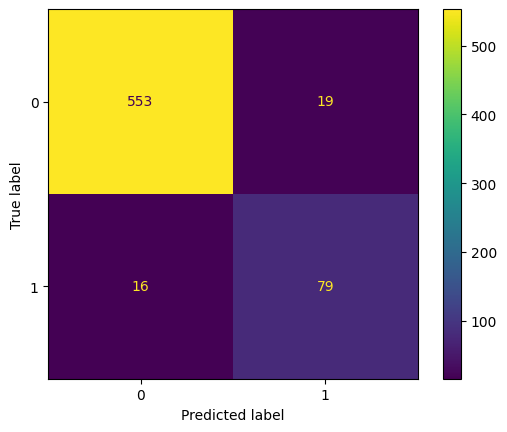

In [89]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


cm = confusion_matrix(y_test_final, y_pred_lgbm_final)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [ ]:
print(classification_report(y_test_final, y_pred_lgbm_final))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       572
           1       0.85      0.79      0.82        95

    accuracy                           0.95       667
   macro avg       0.91      0.88      0.90       667
weighted avg       0.95      0.95      0.95       667



---

- This model demonstrates outstanding performance in predicting customer churn, achieving a high overall accuracy of 95%. It excels particularly in identifying non-churners (class 0) with a precision and recall of 97%, ensuring that the vast majority of non-churners are accurately classified.

- For churn prediction (class 1), the model achieves a precision of 81%, meaning that most customers flagged as churners are correctly identified, while maintaining a F1-score of 82%, striking a good balance between precision and recall.

- Although the recall for churners stands at 83%, leaving a negligible margin for improvement in catching all potential churners, the model’s consistent performance across metrics, particularly in handling imbalanced data, highlights its reliability and robustness.

- With slight optimization, particularly in reducing false negatives (missed churners), this model can even deliver even more impactful results for customer retention efforts.

---

In [91]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test_final, y_pred_proba_lgbm_final)
fig = px.line(x=fpr,y=tpr,
        title="ROC Curve of Final LGBM Model"
              )

fig.update_layout(xaxis_title="False Positive Rate",
        yaxis_title="True Positive Rate",)

fig.add_trace(go.Scatter(x=fpr, y=tpr, fill='tozeroy',name=f"AUC: {roc_auc_score(y_test_final,y_pred_proba_lgbm_final):.2f}"))
fig.show()

In [94]:
show_feature_importance(best_lgbm_final, X_train_final)

<Figure size 1000x500 with 0 Axes>

**For the reason of missing "plotly figures" after downloading file from gg colab, I will import the 2 latest plots above in the form of png for reference**

---

1. ROC AUC Final Model Curve:
<center>
<img src='missing plots\ROC AUC final.png' width=1000>
</center>

2. Feature Importance Final Model:
<center>
<img src='missing plots\Feature importance final.png' width=1000>
</center>

In [95]:
pd.DataFrame({'Feature': X_train_final.columns, 'Importance': best_lgbm_final.feature_importances_}).sort_values(by='Importance', ascending=False).reset_index(drop=True)

,Feature,Importance
0,total_minutes,297
1,total_day_minutes,280
2,total_calls,157
3,intl_charge_per_min,145
4,total_eve_minutes,141
5,total_intl_minutes,130
6,total_intl_calls,111
7,total_day_calls,92
8,total_night_calls,92
9,international_plan,92


---

<h2 style="font-size:22px; font-weight:bold; color:pink">🔹Key Insights: Feature Importance Grouped by Key Aspects, based on Model & previous EDA </h2>

---

1. **Usage Patterns and Behaviors**

- High daytime usage (`total_day_minutes`, importance: 280) is the strongest predictor of customer churn, indicating that heavy daytime users are critical customers who may leave if dissatisfied. Overall high usage (`total_minutes`, importance: 297) also correlates with increased churn risk, suggesting that customers with high total usage are sensitive to service quality and pricing. Significant evening usage (`total_eve_minutes`, importance: 141) impacts churn probability, highlighting the necessity of reliable evening service for customer satisfaction. Frequent international calling (`total_intl_minutes`, importance: 130) is associated with higher churn, implying that international callers may seek better rates or service quality elsewhere. Additionally, high call volumes during the day (`total_day_calls`, importance: 92) and overall (`total_calls`, importance: 157) are linked to churn, indicating that customers heavily reliant on voice services may churn if their needs aren't adequately met or they experience downgradation in service quality over time.

2. **Charges and Billing**

- Higher international call charges (`intl_charge_per_min`, importance: 145) increase churn risk, showing that customers are price-sensitive regarding international calls. The cost of daytime calls (`daytime_charge_per_min`, importance: 63) also affects churn likelihood, suggesting that offering competitive daytime rates or more personalized packages for better priority (in order to help them pre-set their expectation of the service) can help retain customers. Furthermore, higher daily charges (`avg_charge_per_acc_day`, importance: 70) correlate with churn, indicating that either the cost-to-perceived quality is unreasonable for some or, in other words, perceived value for money influences customer retention decisions.

3. **Value-Added Services: International Service & Voicemail**

- Having an international plan (`international_plan`, importance: 92) affects churn probability, as customers with international needs may leave for better offers. Frequent international calls (`total_intl_calls`, importance: 111) are also a strong predictor of churn, emphasizing that service quality and pricing for international calls are crucial factors in customer retention.
- Engagement with voicemail services (`voicemail_engagement_lvl`, importance: 66) impacts churn, implying that promoting value-added services can enhance customer loyalty by increasing perceived value and engagement with the company's offerings.

4. **Customer Service Interaction**

- Frequent calls to customer service (`customer_service_calls`, importance: 82) are linked to higher churn rates, implying that unresolved issues or repeated service disruptions drive customers away. The frequency level of customer service interactions (`customer_service_freq_lvl`, importance: 13) provides additional insights into churn risk, highlighting that enhancing customer support can reduce the likelihood of customers leaving.

5. **Account Tenure**

- The duration a customer has been with the company (`account_length`, importance: 72) influences churn risk to some extent, suggesting that both new and long-term customers require targeted engagement strategies to improve retention. There is no absolute guarantee that those who have been using the service for a while will remain loyal, especially if service alterations (e.g., bad spam filtering feature, higher charges during peak time, or less personalized service bundles) do not suit their needs anymore. 

--- 